<a href="https://colab.research.google.com/github/Max-FM/seagrass-bathymetry/blob/main/notebooks/prepare_MLdata_vanuatu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio geopandas

     |████████████████████████████████| 19.1MB 42.4MB/s 
     |████████████████████████████████| 1.0MB 34.2MB/s 
     |████████████████████████████████| 6.6MB 54.7MB/s 
     |████████████████████████████████| 15.3MB 282kB/s 


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import numpy.random as rnd
from scipy.stats import linregress
from scipy.ndimage import gaussian_filter
from scipy.ndimage.morphology import binary_dilation

import rasterio
from rasterio.plot import show
from rasterio.merge import merge
from rasterio.transform import array_bounds
from rasterio.warp import reproject, Resampling, calculate_default_transform
from rasterio.enums import Resampling

import geopandas as gp
import scipy.interpolate as sip
import shapely
from shapely.geometry import Point, MultiPoint, box

import os
from glob import glob

In [ ]:
from sklearn.model_selection import train_test_split

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import SGDRegressor
from sklearn.neural_network import MLPRegressor

In [ ]:
def rgb(data):
  return np.moveaxis(data[2::-1,:,:], 0, 2)

def ndwi(data):
  """An imperfect water detector, but good enough for now"""
  tmp = (data[1]-data[3])/(data[1]+data[3])
  tmp[np.isnan(tmp)] = -1.
  return tmp > -0.1

def mad(arr):
  return np.median(np.abs(arr-np.median(arr,axis=0)),axis=0)

In [ ]:
def intersecting_tiles(raster_file):
  ref = box(*raster_file.bounds)
  return [idx for idx, bbox in enumerate(bboxes.to_crs(raster_file.crs))
              if ref.intersects(bbox)]

def project_file(raster_file, dst_crs, dst_transform, dst_shape):
  ff = raster_file
  bd = ff.read(1)
  bd[bd < -1e6] = 13
  #tfm_new, w2, h2 = calculate_default_transform(ff.crs, dst_crs, bd.shape[-2], bd.shape[-1], *ff.bounds)
  result, tfm = reproject(bd, np.zeros((1, dst_shape[-2], dst_shape[-1]), dtype=np.float32),
                  src_transform=ff.transform, src_crs=ff.crs, src_nodata=13,
                  dst_transform=dst_transform, dst_crs=dst_crs, dst_resolution=10,
                  resampling=Resampling.bilinear)
  return result, tfm

def change_crs(data, src_crs, src_transform, dst_crs):
  data_bounds = array_bounds(data.shape[1], data.shape[2], src_transform)
  tfm_new, w1, h1 = calculate_default_transform(src_crs, dst_crs,
                                              data.shape[1], data.shape[2],
                                              *data_bounds, resolution=10)
  result, tfm = reproject(data, np.zeros((4, w1, h1), dtype=np.float32),
                              src_transform=src_transform, src_crs=src_crs, src_nodata=None,
                              dst_transform=tfm_new, dst_crs=dst_crs, dst_resolution=10,
                              resampling=Resampling.bilinear)
  return result, tfm

def write_file(fname, data, obj):
  profile = obj.profile

  profile.update(
          dtype=np.float32,
          nodata=-999.,
          count=data.shape[0],
          compress='lzw')

  with rasterio.open(fname, 'w', **profile) as dst:
    dst.write(data.astype(np.float32), 1)

In [ ]:
lidar_path = '/content/drive/Shareddrives/CommonSensing - Innovation in Risk Science/2020 _2021_UoP-CS and GEM/2020 bathymetry & run-up/VU_LiDAR_Bathymetry/'
image_path = '/content/drive/MyDrive/Bathymetry/'

In [ ]:
print(lidar_path)

/content/drive/Shareddrives/CommonSensing - Innovation in Risk Science/2020 _2021_UoP-CS and GEM/2020 bathymetry & run-up/VU_LiDAR_Bathymetry/


In [ ]:
os.chdir('/content/drive/Shareddrives/CommonSensing - Innovation in Risk Science/2020 _2021_UoP-CS and GEM')

In [ ]:
all_files = sorted(glob(image_path+'vanuatu_s2cldmdn_*.tif'))

In [ ]:
#ff = rasterio.open(lidar_path+'01_Efate/bath_efate.tif')
ff = rasterio.open(lidar_path+'02_EspirituSanto/bath_espiritu.tif')

In [ ]:
obj_lst = [rasterio.open(ff) for ff in all_files]
bboxes = gp.GeoSeries([box(*obj.bounds) for obj in obj_lst], crs=obj_lst[0].crs)

In [ ]:
data1, tfm1 = merge([obj_lst[ii] for ii in intersecting_tiles(ff)],
                    indexes=[1,2,3,7], dtype=np.float32)

In [ ]:
data1, tfm1 = change_crs(data1, obj_lst[0].crs, tfm1, ff.crs)
data1 /= 10000.

In [ ]:
depth1, _ = project_file(ff, ff.crs, tfm1, data1.shape)
depth1 = depth1[0]

In [ ]:
#data1 = data1[:,4000:6000,3200:8200]
#depth1 = depth1[4000:6000,3200:8200]

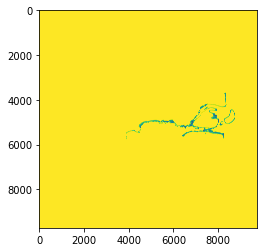

In [ ]:
plt.imshow(depth1)

In [ ]:
def raw_features(data):
    blue = data[0].ravel()
    green = data[1].ravel()
    red = data[2].ravel()
    nir = data[3].ravel()
    blue2 = gaussian_filter(data[0],2.).ravel()
    green2 = gaussian_filter(data[1],2.).ravel()
    red2 = gaussian_filter(data[2],2.).ravel()
    nir2 = gaussian_filter(data[3],2.).ravel()
    return np.vstack((blue, green, red, nir,
                      blue2, green2, red2, nir2)).T

mask = depth1 != 13
X1 = raw_features(data1)[mask.ravel()]
y1 = -depth1[mask].copy()

In [ ]:
np.save(image_path+'espiritu_train.npy', np.hstack((X1, y1.reshape((-1,1)))))

In [ ]:
y1[y1 > 32] = 32.

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, train_size=0.4, random_state=42)

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

In [ ]:
normalizer = preprocessing.Normalization()

In [ ]:
normalizer.adapt(np.array(X_train1))

In [ ]:
X_train1.shape, y_train1.shape

((213039, 8), (213039,))

In [ ]:
def build_and_compile_model(norm):
  model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
  return model

In [ ]:
model = build_and_compile_model(normalizer)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization (Normalization (None, 8)                 17        
_________________________________________________________________
dense (Dense)                (None, 64)                576       
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 4,818
Trainable params: 4,801
Non-trainable params: 17
_________________________________________________________________


In [ ]:
%%time
history = model.fit(
    X_train1, y_train1,
    validation_split=0.2,
    verbose=0, epochs=10)

CPU times: user 1min 15s, sys: 7.97 s, total: 1min 23s
Wall time: 59 s


In [ ]:
def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 10])
  plt.xlabel('Epoch')
  plt.ylabel('Error')
  plt.legend()
  plt.grid(True)

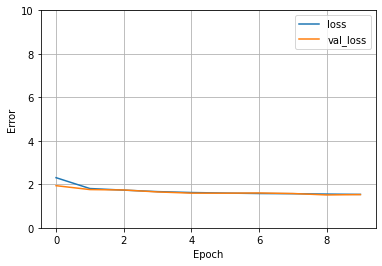

In [ ]:
plot_loss(history)

In [ ]:
y_pred1 = model.predict(X_test1)

In [ ]:
y_pred1.shape

(319559, 1)

In [ ]:
y_train1.shape

(213039,)

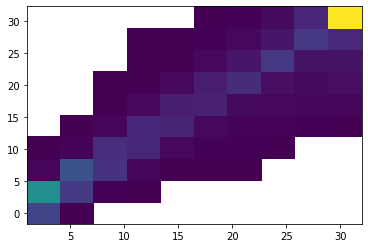

In [ ]:
plt.hist2d(y_test1[::10], y_pred1[::10,0], cmin=1);

In [ ]:
np.std(y_test1-y_pred1[:,0])

NameError: ignored

In [ ]:
regr = make_pipeline(StandardScaler(),
                        MLPRegressor(hidden_layer_sizes=(200,100),
                                        activation='relu',
                                        solver='adam',
                                        max_iter=400))

In [ ]:
regr.fit(X_train1, y_train1)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:573: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('mlpregressor',
                 MLPRegressor(activation='relu', alpha=0.0001,
                              batch_size='auto', beta_1=0.9, beta_2=0.999,
                              early_stopping=False, epsilon=1e-08,
                              hidden_layer_sizes=(200, 100),
                              learning_rate='constant',
                              learning_rate_init=0.001, max_fun=15000,
                              max_iter=400, momentum=0.9, n_iter_no_change=10,
                              nesterovs_momentum=True, power_t=0.5,
                              random_state=None, shuffle=True, solver='adam',
                              tol=0.0001, validation_fraction=0.1,
                              verbose=False, warm_start=False))],
         verbose=False)

In [ ]:
import torch

In [ ]:
y_pred = regr.predict(X_test)

In [ ]:
y_pred2 = regr.predict(X_train)

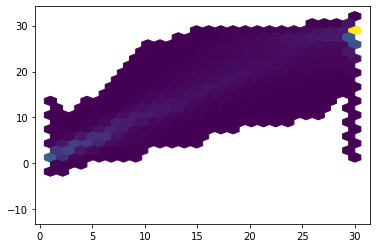

In [ ]:
plt.hexbin(y_test, y_pred, gridsize=25, mincnt=10)

In [ ]:
np.std(y_test-y_pred)

2.9218908939623085

In [ ]:
np.std(y_train-y_pred2)

2.9172283722587133

In [ ]:
regr_inv1 = make_pipeline(StandardScaler(),
                            MLPRegressor(hidden_layer_sizes=(40,40,10),
                                            activation='relu',
                                            solver='adam',
                                            max_iter=100))
regr_inv2 = make_pipeline(StandardScaler(),
                            MLPRegressor(hidden_layer_sizes=(40,40,10),
                                            activation='relu',
                                            solver='adam',
                                            max_iter=100))

In [ ]:
regr_inv1.fit(y_train1.reshape(-1, 1), X_train1)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('mlpregressor',
                 MLPRegressor(activation='relu', alpha=0.0001,
                              batch_size='auto', beta_1=0.9, beta_2=0.999,
                              early_stopping=False, epsilon=1e-08,
                              hidden_layer_sizes=(40, 40, 10),
                              learning_rate='constant',
                              learning_rate_init=0.001, max_fun=15000,
                              max_iter=100, momentum=0.9, n_iter_no_change=10,
                              nesterovs_momentum=True, power_t=0.5,
                              random_state=None, shuffle=True, solver='adam',
                              tol=0.0001, validation_fraction=0.1,
                              verbose=False, warm_start=False))],
         verbose=False)

In [ ]:
regr_inv2.fit(y_train2.reshape(-1, 1), X_train2)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('mlpregressor',
                 MLPRegressor(activation='relu', alpha=0.0001,
                              batch_size='auto', beta_1=0.9, beta_2=0.999,
                              early_stopping=False, epsilon=1e-08,
                              hidden_layer_sizes=(40, 40, 10),
                              learning_rate='constant',
                              learning_rate_init=0.001, max_fun=15000,
                              max_iter=100, momentum=0.9, n_iter_no_change=10,
                              nesterovs_momentum=True, power_t=0.5,
                              random_state=None, shuffle=True, solver='adam',
                              tol=0.0001, validation_fraction=0.1,
                              verbose=False, warm_start=False))],
         verbose=False)

In [ ]:
zarr = np.arange(0,40,0.05)
clr1 = regr_inv1.predict(zarr.reshape(-1,1))
clr2 = regr_inv2.predict(zarr.reshape(-1,1))

In [ ]:
swatch1 = np.array([clr1[:,2::-1] for ii in range(400)])
swatch2 = np.array([clr2[:,2::-1] for ii in range(400)])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


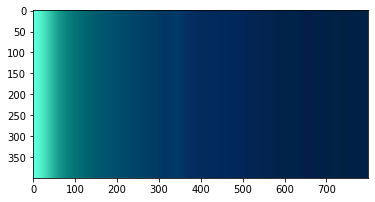

In [ ]:
plt.imshow(10*swatch1)

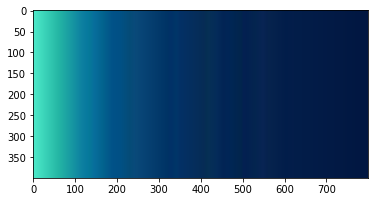

In [ ]:
plt.imshow(10*swatch2)

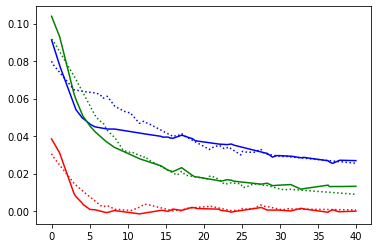

In [ ]:
plt.plot(zarr, clr1[:,0], c='b')
plt.plot(zarr, clr1[:,1], c='g')
plt.plot(zarr, clr1[:,2], c='r')
plt.plot(zarr, clr2[:,0], c='b', ls=':')
plt.plot(zarr, clr2[:,1], c='g', ls=':')
plt.plot(zarr, clr2[:,2], c='r', ls=':')

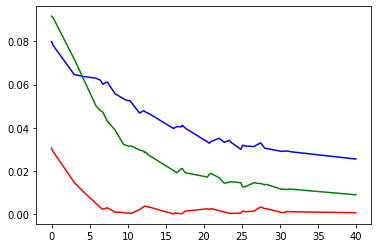

In [ ]:
plt.plot(zarr, clr2[:,0], c='b')
plt.plot(zarr, clr2[:,1], c='g')
plt.plot(zarr, clr2[:,2], c='r')

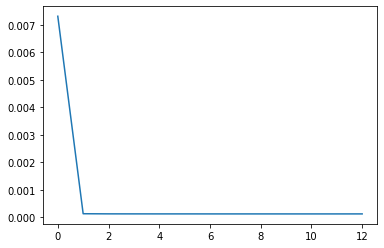

In [ ]:
mlp = regr_inv1.named_steps['mlpregressor']
plt.plot(mlp.loss_curve_)

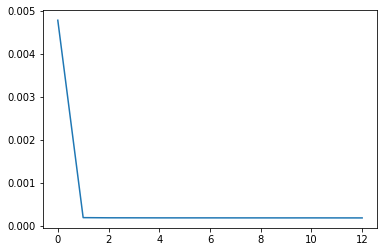

In [ ]:
mlp = regr_inv2.named_steps['mlpregressor']
plt.plot(mlp.loss_curve_)

In [ ]:
regr1 = make_pipeline(StandardScaler(),
                        SGDRegressor(loss='squared_loss', max_iter=1000, tol=1e-5, alpha=0.1))
regr2 = make_pipeline(StandardScaler(),
                        SGDRegressor(loss='squared_loss', max_iter=1000, tol=1e-5, alpha=0.1))

regr3 = make_pipeline(StandardScaler(),
                        SGDRegressor(loss='squared_loss', max_iter=1000, tol=1e-5, alpha=0.1))

In [ ]:
regr1.fit(X_train1, y_train1)
regr2.fit(X_train2, y_train2)

regr3.fit(np.vstack((X_train1,X_train2)), np.hstack((y_train1, y_train2)))
y_test3 = np.hstack((y_test1, y_test2))

In [ ]:
mask1 = y_test1 < 30
mask2 = y_test2 < 30
mask3 = y_test3 < 30

In [ ]:
y_err1 = regr1.predict(X_test1)-y_test1
y_err2 = regr2.predict(X_test2)-y_test2

y_err3 = regr3.predict(np.vstack((X_test1,X_test2)))-y_test3

In [ ]:
y_err1x = regr2.predict(X_test1)-y_test1
y_err2x = regr1.predict(X_test2)-y_test2

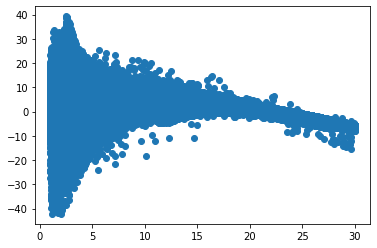

In [ ]:
plt.scatter(y_test1[mask1], y_err1[mask1])

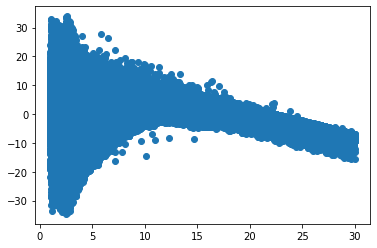

In [ ]:
plt.scatter(y_test3[mask3], y_err3[mask3])

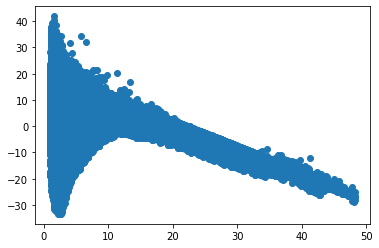

In [ ]:
plt.scatter(y_test2, y_err2)

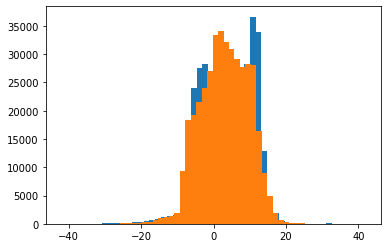

In [ ]:
plt.hist(y_err1[mask1], bins=50);
plt.hist(y_err2[mask2], bins=50);

In [ ]:
np.std(y_err1[mask1]), np.std(y_err2[mask2])

(7.032075770877003, 6.582009360823981)

In [ ]:
np.std(y_err1x[mask1]), np.std(y_err2x[mask2]), np.std(y_err3[mask3])

(6.994850021209916, 7.138284213516926, 6.668419757906878)

In [ ]:
regr4 = make_pipeline(StandardScaler(),
                        MLPRegressor(hidden_layer_sizes=(10,10),
                                        activation='relu',
                                        solver='adam',
                                        max_iter=100))

In [ ]:
regr4.fit(np.vstack((X_train1,X_train2)), np.hstack((y_train1, y_train2)))

/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('mlpregressor',
                 MLPRegressor(activation='relu', alpha=0.0001,
                              batch_size='auto', beta_1=0.9, beta_2=0.999,
                              early_stopping=False, epsilon=1e-08,
                              hidden_layer_sizes=(10, 10),
                              learning_rate='constant',
                              learning_rate_init=0.001, max_fun=15000,
                              max_iter=100, momentum=0.9, n_iter_no_change=10,
                              nesterovs_momentum=True, power_t=0.5,
                              random_state=None, shuffle=True, solver='adam',
                              tol=0.0001, validation_fraction=0.1,
                              verbose=False, warm_start=False))],
         verbose=False)

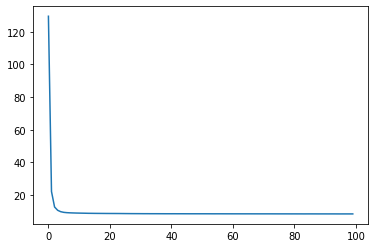

In [ ]:
mlp = regr4.named_steps['mlpregressor']
plt.plot(mlp.loss_curve_)

In [ ]:
y_err4 = regr4.predict(np.vstack((X_test1,X_test2)))-y_test3

In [ ]:
np.std(y_err4[mask3]), mad(y_err4[mask3])

(3.3410565366376006, 1.293588955039057)

In [ ]:
np.std(y_err4[mask3]), mad(y_err4[mask3])

(3.3410565366376006, 1.293588955039057)

In [ ]:
from joblib import dump
#dump(regr4, 'ML2_NNregress.joblib')

['ML2_NNregress.joblib']

In [ ]:
from joblib import load
regr4 = load('ML2_NNregress.joblib')

In [ ]:
dtst = rasterio.open('fiji_ML2_000036.tif').read()

(array([5.000000e+00, 8.000000e+00, 4.410000e+02, 1.049898e+06,
        1.302020e+05, 1.285600e+05, 1.523500e+05, 4.109270e+05,
        3.778397e+06, 6.042130e+05]),
 array([-22.230312 , -15.815342 ,  -9.4003725,  -2.9854023,   3.4295678,
          9.844538 ,  16.259508 ,  22.674479 ,  29.089447 ,  35.504417 ,
         41.919388 ], dtype=float32),
 <a list of 10 Patch objects>)

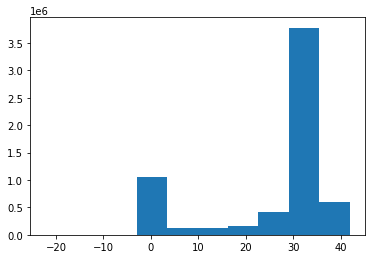

In [ ]:
plt.hist(dtst[0].ravel())

In [ ]:
def apply_ML(data, regr):
    blue = gaussian_filter(data[0],1.).reshape((-1,))
    green = gaussian_filter(data[1],1.).reshape((-1,))
    red = gaussian_filter(data[2],1.).reshape((-1,))
    tmp = np.vstack((np.log(blue), np.log(green), np.log(red),
                        (blue-green)/(blue+green),
                        np.log(blue/green))).T
    tmp[np.isnan(tmp)] = -5.
    
    tmp = regr.predict(tmp)
    return tmp.reshape(data.shape[1:])

In [ ]:
depth1_ml = apply_ML(data1_ng, regr4)

In [ ]:
ndwi1 = ndwi(data1)

<ipython-input-5-7415058d9085>:6: RuntimeWarning: invalid value encountered in true_divide
  tmp = (data[1]-data[3])/(data[1]+data[3])


In [ ]:
tst = medfilt2d(dpth1)

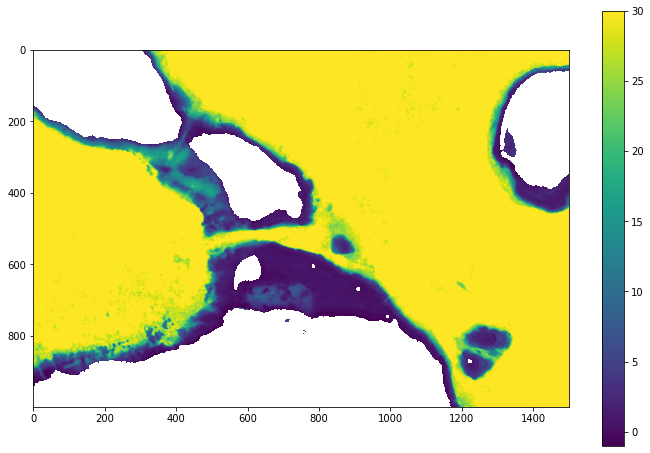

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(tst[1700:2700,5500:7000], vmin=-1,vmax=30)
plt.colorbar()

In [ ]:
from scipy.signal import medfilt2d
dpth1 = depth1_ml.copy()
#dpth1 = medfilt2d(dpth1, 3)
dpth1[dpth1 > 30] = 30.
dpth1[~ndwi1] = np.nan

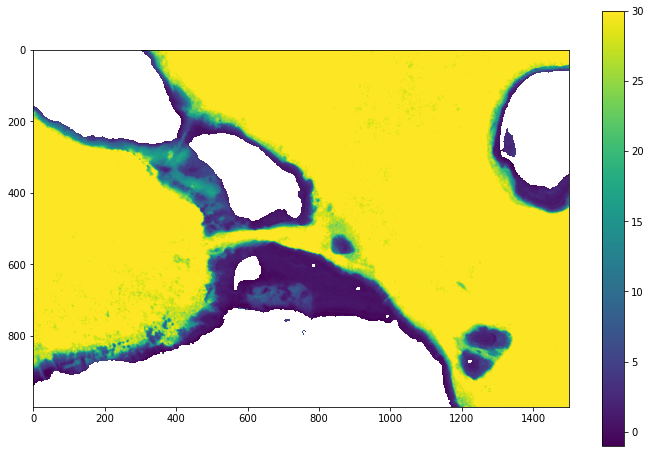

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(dpth1[1700:2700,5500:7000], vmin=-1,vmax=30)
plt.colorbar()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


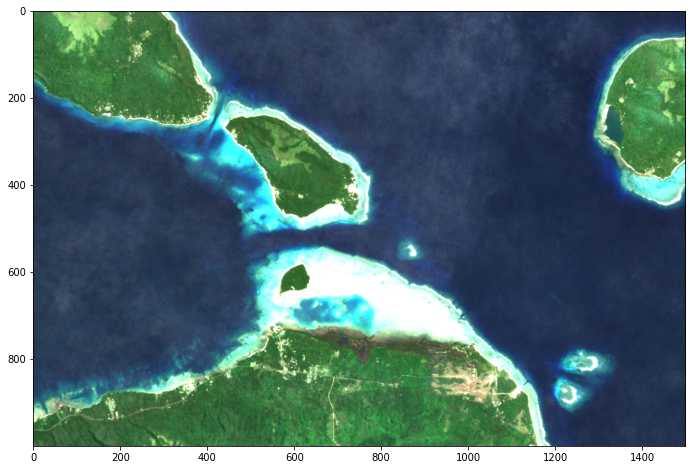

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(8*rgb(data1[:,1700:2700,5500:7000]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


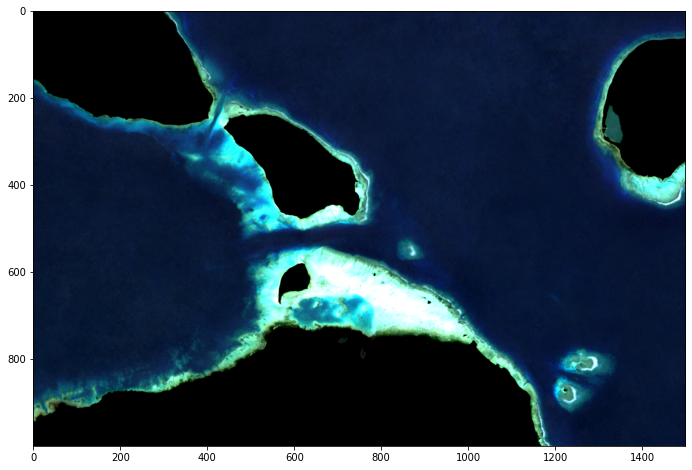

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(8*rgb(data1_ng[:,1700:2700,5500:7000]))

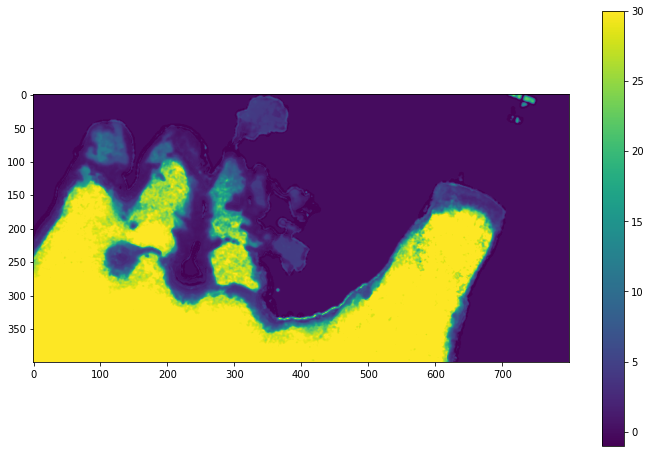

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(dpth1[5200:5600,5200:6000], vmin=-1, vmax=30)
plt.colorbar()

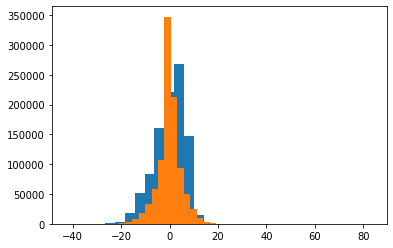

In [ ]:
plt.hist(y_err3, bins=30);
plt.hist(y_err4, bins=30);

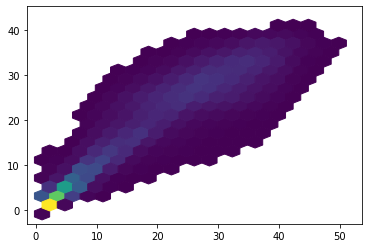

In [ ]:
plt.hexbin(y_test3, y_err4+y_test3, mincnt=100, gridsize=20)

In [ ]:
np.std(y_err4[mask3]), np.std(y_err3[mask3])

(3.866896546315206, 4.699946412375249)

In [ ]:
mad(y_err4[mask3]), mad(y_err3[mask3])

(1.6624874479578908, 3.207468189383224)

In [ ]:
def raw_features2(data, mask):
    blue = gaussian_filter(data[0][mask],1.).ravel()
    green = gaussian_filter(data[1][mask],1.).ravel()
    red = gaussian_filter(data[2][mask],1.).ravel()
    tmp = np.vstack((blue, green, red)).T
    return tmp

mask = np.logical_and(depth1 != 13, depth1 < -1)
X1 = raw_features(data1_ng, mask)
y1 = -depth1[mask].copy()

mask = np.logical_and(depth2 != 13, depth2 < -1)
X2 = raw_features(data2_ng, mask)
y2 = -depth2[mask].copy()

X = np.vstack((X1,X2))
y = np.concatenate((y1,y2))

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1, random_state=42)

In [ ]:
regr5 = make_pipeline(StandardScaler(),
                        MLPRegressor(hidden_layer_sizes=(20,20),
                                        activation='relu',
                                        solver='sgd',
                                        max_iter=200))

In [ ]:
regr5.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=(20, 20), solver='sgd'))])

In [ ]:
y_err5 = regr5.predict(X_test)-y_test

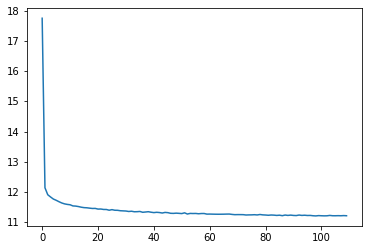

In [ ]:
mlp = regr5.named_steps['mlpregressor']
plt.plot(mlp.loss_curve_)

In [ ]:
np.std(y_err5[y_test < 30]), mad(y_err5[y_test < 30])

(4.01870919662642, 1.7108555640044991)

In [ ]:
avgD1 = []
errs1 = []
avgD2 = []
errs2 = []
xarr = np.arange(1, 45, 0.5)
for dval in xarr:
    mtmp = np.abs(y1-dval) < 0.5
    avg = np.median(X1[mtmp,:], axis=0)
    avgD1.append(avg)
    errs1.append(np.std(X1[mtmp,:]-avg, axis=0))
    
    mtmp = np.abs(y2-dval) < 0.5
    avg = np.median(X2[mtmp,:], axis=0)
    avgD2.append(avg)
    errs2.append(np.std(X2[mtmp,:]-avg, axis=0))
avgD1 = np.array(avgD1)
avgD2 = np.array(avgD2)
errs1 = np.array(errs1)
errs2 = np.array(errs2)

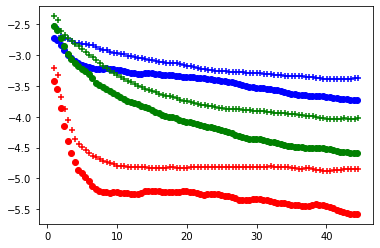

In [ ]:
plt.scatter(xarr-0.05, avgD1[:,0], c='b')
plt.scatter(xarr+0.05, avgD2[:,0], c='b', marker='+')
plt.scatter(xarr-0.05, avgD1[:,1], c='g')
plt.scatter(xarr+0.05, avgD2[:,1], c='g', marker='+')
plt.scatter(xarr-0.05, avgD1[:,2], c='r')
plt.scatter(xarr+0.05, avgD2[:,2], c='r', marker='+')

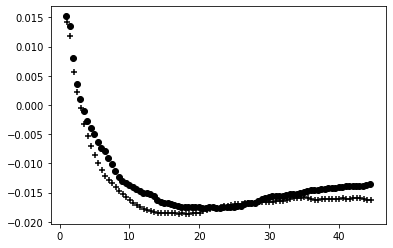

In [ ]:
plt.scatter(xarr-0.05, avgD1[:,3], c='k')
plt.scatter(xarr+0.05, avgD2[:,3], c='k', marker='+')

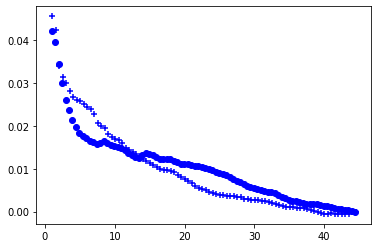

In [ ]:
plt.scatter(xarr-0.05, avgD1[:,0]-avgD1[-1,0], c='b')
plt.scatter(xarr+0.05, avgD2[:,0]-avgD2[-1,0], c='b', marker='+')

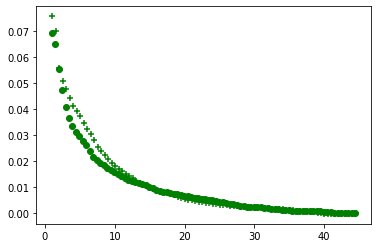

In [ ]:
plt.scatter(xarr-0.05, avgD1[:,1]-avgD1[-1,1], c='g')
plt.scatter(xarr+0.05, avgD2[:,1]-avgD2[-1,1], c='g', marker='+')

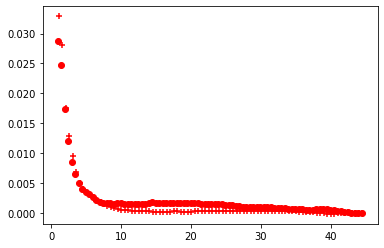

In [ ]:
plt.scatter(xarr-0.05, avgD1[:,2]-avgD1[-1,2], c='r')
plt.scatter(xarr+0.05, avgD2[:,2]-avgD2[-1,2], c='r', marker='+')

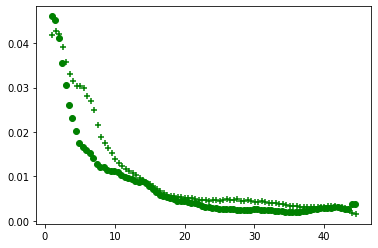

In [ ]:
plt.scatter(xarr-0.05, errs1[:,1], c='g')
plt.scatter(xarr+0.05, errs2[:,1], c='g', marker='+')

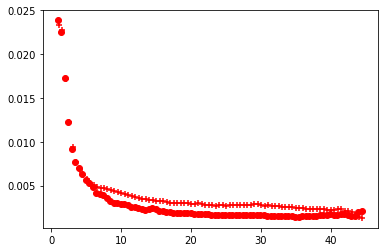

In [ ]:
plt.scatter(xarr-0.05, errs1[:,2], c='r')
plt.scatter(xarr+0.05, errs2[:,2], c='r', marker='+')

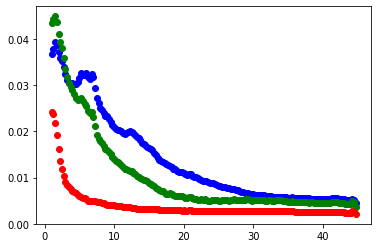

In [ ]:
plt.scatter(xarr, [np.std(ee[:,0]) for ee in errs], c='b')
plt.scatter(xarr, [np.std(ee[:,1]) for ee in errs], c='g')
plt.scatter(xarr, [np.std(ee[:,2]) for ee in errs], c='r')

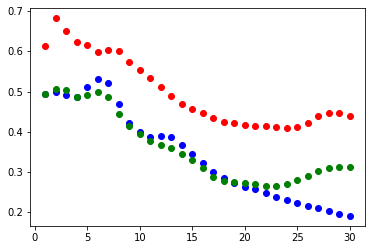

In [ ]:
plt.scatter(np.arange(1, 31), stdD[:,0]/avgD[:,0], c='b')
plt.scatter(np.arange(1, 31), stdD[:,1]/avgD[:,1], c='g')
plt.scatter(np.arange(1, 31), stdD[:,2]/avgD[:,2], c='r')

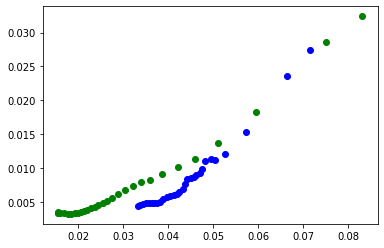

In [ ]:
plt.scatter(avgD[:,0], stdD[:,0], c='b')
plt.scatter(avgD[:,1], stdD[:,1], c='g')

In [ ]:
gs1 = deep_water_map(data1, ndwi1)
gs2 = deep_water_map(data2, ndwi2)
gs1_ng = deep_water_map(data1_ng, ndwi1)
gs2_ng = deep_water_map(data2_ng, ndwi2)
dw1 = np.nanmin(gs1_ng, axis=(0,1))
dw2 = np.nanmin(gs2_ng, axis=(0,1))

In [ ]:
dw1, dw2

(array([0.02208978, 0.00789386, 0.00335192], dtype=float32),
 array([0.02374433, 0.00840619, 0.00232193], dtype=float32))

(0.0, 0.1)

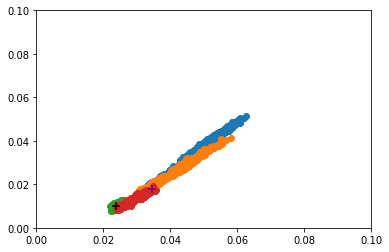

In [ ]:
plt.scatter(gs1[:,:,0].ravel(), gs1[:,:,1].ravel())
plt.scatter(gs2[:,:,0].ravel(), gs2[:,:,1].ravel())
plt.scatter(gs1_ng[:,:,0].ravel(), gs1_ng[:,:,1].ravel())
plt.scatter(gs2_ng[:,:,0].ravel(), gs2_ng[:,:,1].ravel())
plt.scatter(avgD1[-1,0], avgD1[-1,1], s=50, marker='+', c='k')
plt.scatter(avgD2[-1,0], avgD2[-1,1], s=50, marker='+', c='purple')
plt.xlim(0,0.1)
plt.ylim(0,0.1)

(0.0, 0.1)

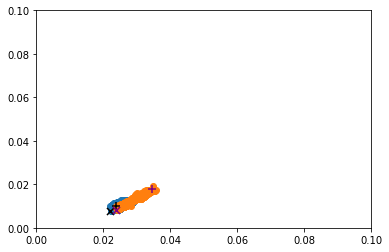

In [ ]:
plt.scatter(gs1_ng[:,:,0].ravel(), gs1_ng[:,:,1].ravel())
plt.scatter(gs2_ng[:,:,0].ravel(), gs2_ng[:,:,1].ravel())
plt.scatter(avgD1[-1,0], avgD1[-1,1], s=50, marker='+', c='k')
plt.scatter(avgD2[-1,0], avgD2[-1,1], s=50, marker='+', c='purple')
plt.scatter(dw1[0], dw1[1], s=50, marker='x', c='k')
plt.scatter(dw2[0], dw2[1], s=50, marker='x', c='purple')
plt.xlim(0,0.1)
plt.ylim(0,0.1)

In [ ]:
avgD1[-1,:] - dw1

array([0.00180507, 0.00231628, 0.00044107], dtype=float32)

In [ ]:
avgD2[-1,:] - dw2

array([0.0106611 , 0.00940851, 0.00548916], dtype=float32)

In [ ]:
data1.shape

(4, 9672, 9674)

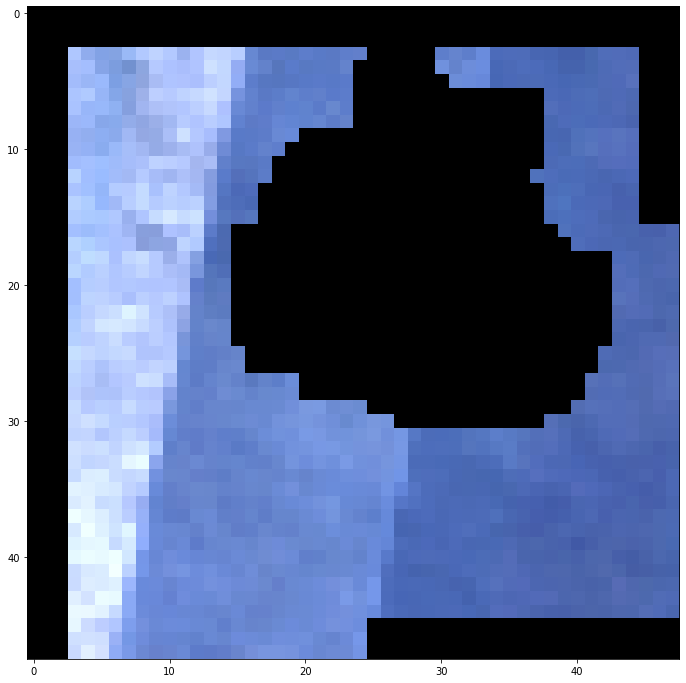

In [ ]:
plt.figure(figsize=(12,12))
plt.imshow(20*gs1[:,:,2::-1])

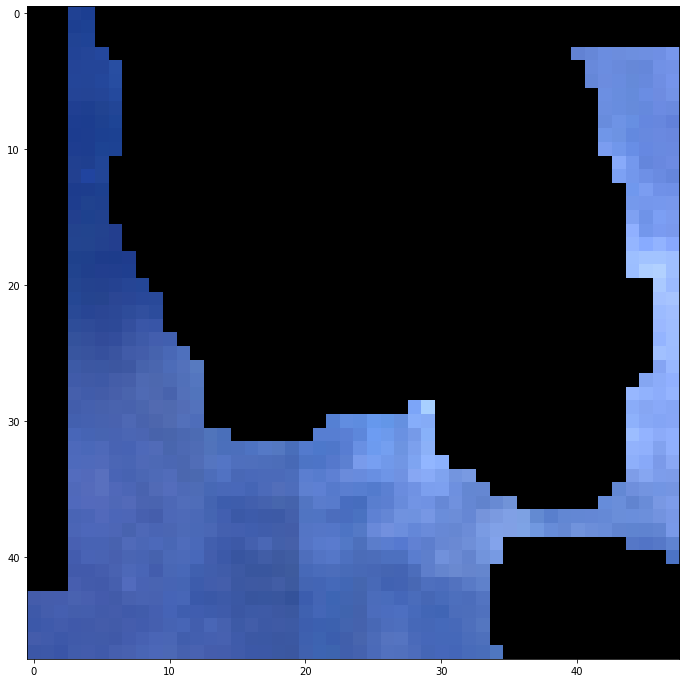

In [ ]:
plt.figure(figsize=(12,12))
plt.imshow(20*gs2[:,:,2::-1])

In [ ]:
def build_features(data, mask):
    blue = gaussian_filter(data[0], 1.)[mask].ravel()
    green = gaussian_filter(data[1], 1.)[mask].ravel()
    red = gaussian_filter(data[2], 1.)[mask].ravel()
    tmp = np.vstack(((blue-green)/(blue+green),
                        (green-red)/(green+red),
                        np.log(blue/green),
                        np.log(green)/np.log(blue),
                        np.log(blue)/np.log(green))).T
    return tmp

In [ ]:
mask = np.logical_and(depth1 != 13, np.logical_and(depth1 < -1, depth1 > -28))
X1 = build_features(data1_ng, mask)
y1 = -depth1[mask].copy()

mask = np.logical_and(depth2 != 13, np.logical_and(depth2 < -1, depth2 > -28))
X2 = build_features(data2_ng, mask)
y2 = -depth2[mask].copy()

#mask = np.zeros((500,500))==0.
#X3 = build_features(data1_ng[:,6000:8000:4,5000:7000:4], mask)
#y3 = 50.*np.ones(500*500)

X = np.vstack((X1,X2))
y = np.concatenate((y1,y2))

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1, random_state=42)

In [ ]:
assert not np.any(np.isnan(X))

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import SGDRegressor

regr = make_pipeline(StandardScaler(),
                        PolynomialFeatures(degree=1),
                        SGDRegressor(loss='squared_loss', max_iter=1000, tol=1e-5, alpha=1))

In [ ]:
regr.fit(X_train, y_train**2)
ypred1 = np.abs(regr.predict(X_train))**0.5
ypred2 = np.abs(regr.predict(X_test))**0.5

In [ ]:
mad((ypred2-y_test)[y_test < 15]), mad((ypred2-y_test)[y_test > 15])

(1.3167184100749223, 2.7541595200352624)

(0.0, 30.0)

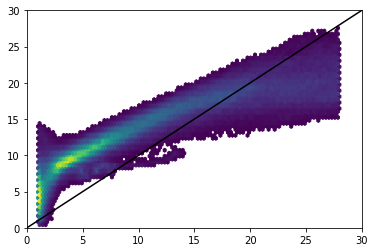

In [ ]:
plt.hexbin(y_test, ypred2, mincnt=50)
plt.plot([0,30],[0,30], c='k')
plt.xlim(0,30)
plt.ylim(0,30)

In [ ]:
import scipy.signal as sig

In [ ]:
accum = []
for ii in np.arange(0,5,0.05):
    tmp1 = gaussian_filter(data1[0,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp2 = gaussian_filter(data1[1,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp3 = gaussian_filter(data1[2,6000:8048,200:2248], ii)[32:-32,32:-32]
    accum.append((ii, np.std(tmp1),np.std(tmp2),np.std(tmp3)))
accum1 = np.array(accum)

accum = []
for ii in np.arange(0,5,0.05):
    tmp1 = gaussian_filter(data1_ng[0,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp2 = gaussian_filter(data1_ng[1,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp3 = gaussian_filter(data1_ng[2,6000:8048,200:2248], ii)[32:-32,32:-32]
    accum.append((ii, np.std(tmp1),np.std(tmp2),np.std(tmp3)))
accum1a = np.array(accum)

In [ ]:
accum = []
for ii in np.arange(0,5,0.05):
    tmp1 = gaussian_filter(data2[0,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp2 = gaussian_filter(data2[1,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp3 = gaussian_filter(data2[2,6000:8048,200:2248], ii)[32:-32,32:-32]
    accum.append((ii, np.std(tmp1),np.std(tmp2),np.std(tmp3)))
accum2 = np.array(accum)

accum = []
for ii in np.arange(0,5,0.05):
    tmp1 = gaussian_filter(data2_ng[0,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp2 = gaussian_filter(data2_ng[1,6000:8048,200:2248], ii)[32:-32,32:-32]
    tmp3 = gaussian_filter(data2_ng[2,6000:8048,200:2248], ii)[32:-32,32:-32]
    accum.append((ii, np.std(tmp1),np.std(tmp2),np.std(tmp3)))
accum2a = np.array(accum)

(0.0, 0.012)

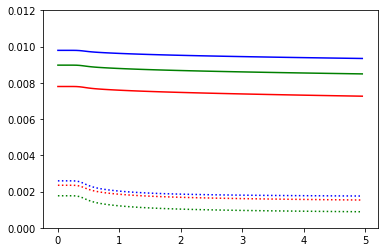

In [ ]:
plt.plot(accum1[:,0], accum1[:,3], c='b')
plt.plot(accum1a[:,0], accum1a[:,3], c='b', ls=':')
plt.plot(accum1[:,0], accum1[:,2], c='g')
plt.plot(accum1a[:,0], accum1a[:,2], c='g', ls=':')
plt.plot(accum1[:,0], accum1[:,1], c='r')
plt.plot(accum1a[:,0], accum1a[:,1], c='r', ls=':')
plt.ylim(0,0.012)

(0.0, 0.012)

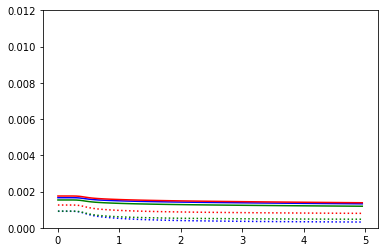

In [ ]:
plt.plot(accum2[:,0], accum2[:,3], c='b')
plt.plot(accum2a[:,0], accum2a[:,3], c='b', ls=':')
plt.plot(accum2[:,0], accum2[:,2], c='g')
plt.plot(accum2a[:,0], accum2a[:,2], c='g', ls=':')
plt.plot(accum2[:,0], accum2[:,1], c='r')
plt.plot(accum2a[:,0], accum2a[:,1], c='r', ls=':')
plt.ylim(0,0.012)

In [ ]:
deep1 = data1_ng[:,8000:9000,0:1000]
deep2 = data1_ng[:,8000:9000,3000:4000]
deep3 = data1_ng[:,8000:9000,7000:8000]

In [ ]:
pca = PCA(n_components=3)

In [ ]:
pca.fit(deep2.reshape((4,-1)).T)

PCA(n_components=3)

In [ ]:
pca.components_

array([[ 9.4858753e-03,  9.8814946e-01,  1.5294562e-01,  8.8558579e-03],
       [ 6.0591169e-02, -1.5318720e-01,  9.8631769e-01, -6.2949904e-03],
       [-9.9737751e-01,  4.6580171e-04,  6.1095174e-02, -3.8794950e-02]],
      dtype=float32)

In [ ]:
pca.explained_variance_ratio_

array([0.87738853, 0.07486684, 0.02947166])

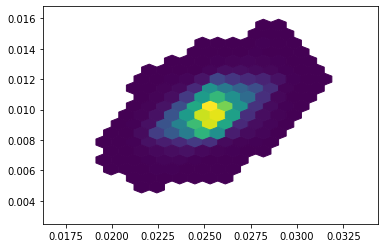

In [ ]:
plt.hexbin(deep2[0].ravel(),deep2[1].ravel(), mincnt=10, gridsize=20);

In [ ]:
plt.figure(figsize=(12,12))
plt.scatter(deep1[3].ravel(),deep1[0].ravel(), alpha=0.1)
plt.scatter(deep2[3].ravel(),deep2[0].ravel(), alpha=0.1)
plt.scatter(deep3[3].ravel(),deep3[0].ravel(), alpha=0.1)

IndexError: index 3 is out of bounds for axis 0 with size 3

<Figure size 864x864 with 0 Axes>

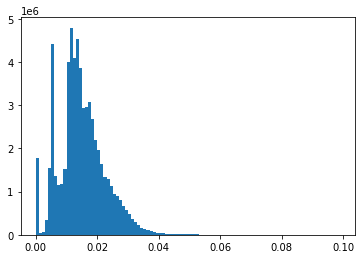

In [ ]:
plt.hist(data2[3,:,:].ravel(), bins=np.arange(0,0.1,0.001));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


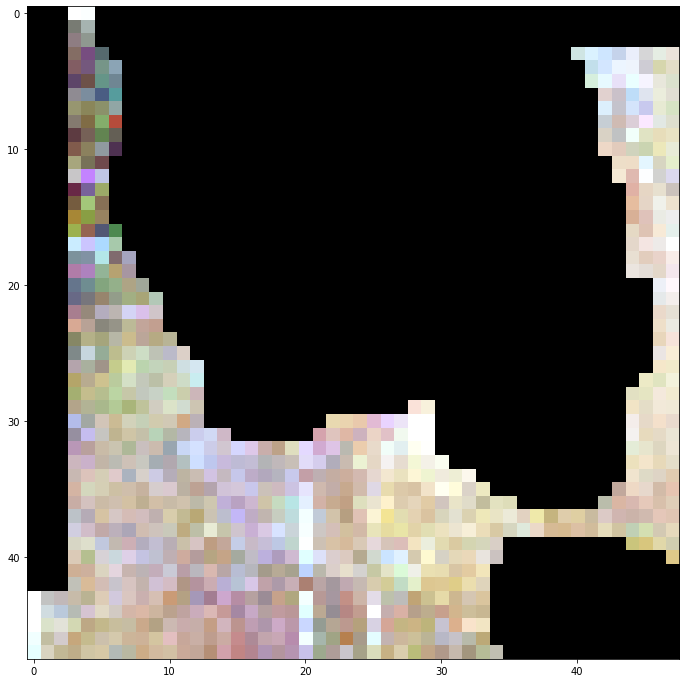

In [ ]:
plt.figure(figsize=(12,12))
plt.imshow(cf2[:,:,2::-1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


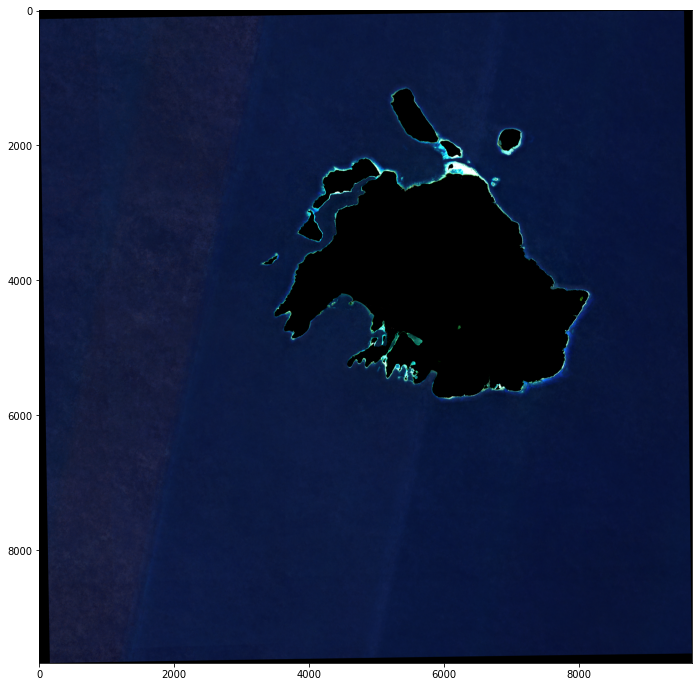

In [ ]:
plt.figure(figsize=(12,12))
plt.imshow(10*data1_ng[:,:,2::-1])

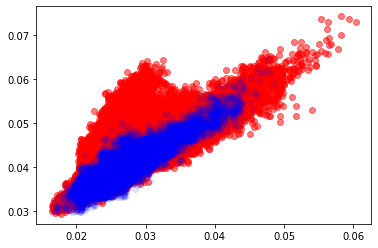

In [ ]:
mask1 = np.logical_and(depth1 != 13, depth1 < -40)
mask2 = np.logical_and(depth1 != 13, np.logical_and(depth1 < -30, depth1 > -40))
plt.scatter(data1[1][mask2].ravel(), data1[0][mask2].ravel(), c='r', alpha=0.5)
plt.scatter(data1[1][mask1].ravel(), data1[0][mask1].ravel(), c='b', alpha=0.1)

In [ ]:
mask3 = np.logical_and(depth1 != 13, depth1 < -25)

In [ ]:
nmf = NMF(n_components=2, max_iter=2000)

In [ ]:
pca = PCA(n_components=4, whiten=True)

In [ ]:
proj = nmf.fit_transform(data1[:,mask3].reshape((4,-1)).T)

In [ ]:
nmf.components_

array([[3.0126092 , 0.36966708, 0.        , 0.02327412],
       [0.        , 2.1852622 , 0.98453856, 0.05066423]], dtype=float32)

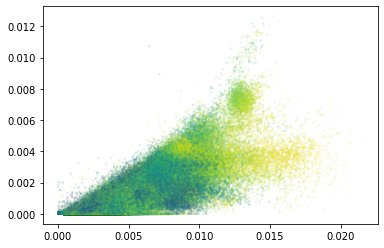

In [ ]:
plt.scatter(proj[:,0], proj[:,1], c=depth1[mask3], s=2, alpha=0.1)

In [ ]:
regr = make_pipeline(StandardScaler(),
                        #PolynomialFeatures(degree=2),
                        SGDRegressor(loss='huber', max_iter=1000, tol=1e-5, alpha=1e-1))

In [ ]:
regr.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('sgdregressor',
                 SGDRegressor(alpha=0.1, loss='huber', tol=1e-05))])

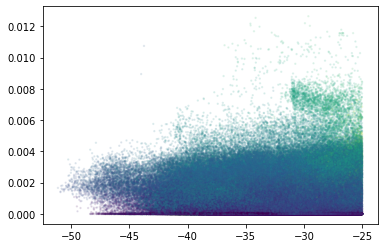

In [ ]:
plt.scatter(depth1[mask3], proj[:,1], c=proj[:,0], s=2, alpha=0.1)

In [ ]:
tmp = regr.named_steps['sgdregressor']

In [ ]:
avgD = []
stdD = []
for dval in np.arange(1, 39):
    mtmp = np.abs(y-dval) < 1
    avgD.append(np.median(X[mtmp,:], axis=0))
    stdD.append(mad(X[mtmp,:]))
avgD = np.array(avgD)
stdD = np.array(stdD)

In [ ]:
tmp.coef_

array([-0.00371103, -0.09157635,  0.44342135,  0.17767134,  0.39213782,
       -0.00077888, -0.07458137,  0.0900869 , -0.06311481,  0.08352303,
       -0.07116471,  0.05167824, -0.01032212,  0.00870932,  0.00670148])

In [ ]:
ypred1 = regr.predict(X_train)
ypred2 = regr.predict(X_test)

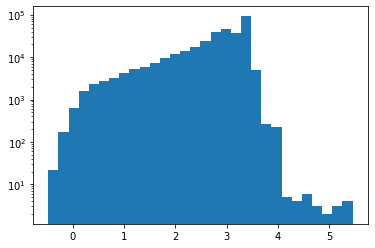

In [ ]:
plt.hist(ypred1, bins=30, log=True);

(0.0, 50.0)

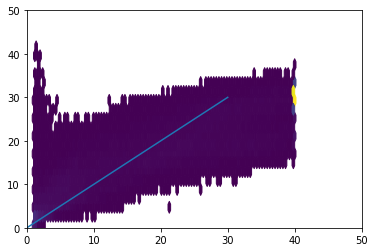

In [ ]:
plt.hexbin(np.exp(y_train), np.exp(ypred1), mincnt=10)
plt.plot([0,30], [0,30])
plt.xlim(0,50)
plt.ylim(0,50)

(0.0, 50.0)

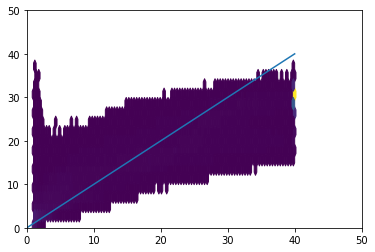

In [ ]:
plt.hexbin(np.exp(y_test), np.exp(ypred2), mincnt=50)
plt.plot([0,40], [0,40])
plt.xlim(0,50)
plt.ylim(0,50)

In [ ]:
np.std((np.exp(ypred1)-np.exp(y_train))[y_train**2<30]), np.std((ypred2**2-y_test**2)[y_test**2<30])

(2.342349246414088, 2.3412086940621384)

In [ ]:
mad((ypred1**2-y_train**2)), mad((ypred2**2-y_test**2))

(0.9294485137974358, 0.920439659666286)

In [ ]:
from joblib import dump, load

In [ ]:
dump(regr, 'depth_sqrt_regression.joblib') 

['depth_sqrt_regression.joblib']

In [ ]:
regr2 = load('depth_sqrt_regression.joblib')

In [ ]:
ypred1 = regr2.predict(X1)
ypred2 = regr2.predict(X2)
ypred3 = regr2.predict(X3)

ValueError: X has 7 features, but this StandardScaler is expecting 5 features as input.

In [ ]:
np.std(y1-ypred1**2),np.std(y2-ypred2**2),np.std(30-ypred3**2)

(7.816285300152852, 5.851200313836167, 4.461638644712566)

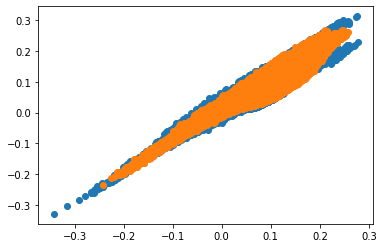

In [ ]:
plt.scatter(X1[:,0], X1[:,1])
plt.scatter(X2[:,0], X2[:,1])

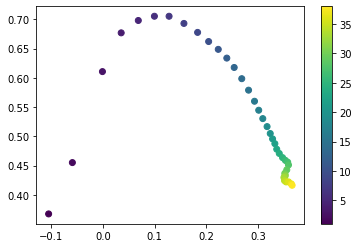

In [ ]:
plt.scatter(avgD[:,4], avgD[:,5], c=np.arange(1,39))
plt.colorbar()

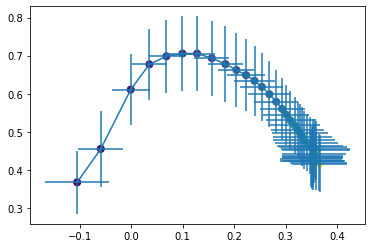

In [ ]:
plt.errorbar(avgD[:,4], avgD[:,5], xerr=stdD[:,4], yerr=stdD[:,5])
plt.scatter(avgD[:,4], avgD[:,5], c=np.arange(1,39), s=50)

In [ ]:
avgD

array([[6.93546832e-02, 8.51745009e-02, 3.83569524e-02, 7.24863401e-03,
        3.61530423e-01, 4.40871567e-01, 1.97600603e-01],
       [6.64871261e-02, 7.70197436e-02, 2.53554881e-02, 3.41377663e-03,
        3.98232281e-01, 4.53967720e-01, 1.47798896e-01],
       [5.91580309e-02, 6.26134351e-02, 1.31458305e-02, 2.15566065e-03,
        4.41340685e-01, 4.58981484e-01, 9.96783450e-02],
       [5.58670573e-02, 5.48150726e-02, 8.85615218e-03, 1.37903797e-03,
        4.69329864e-01, 4.53399062e-01, 7.72765279e-02],
       [5.40846884e-02, 4.94094044e-02, 6.96004275e-03, 9.68049979e-04,
        4.90363061e-01, 4.43117261e-01, 6.65266439e-02],
       [5.31509891e-02, 4.50245179e-02, 5.87529782e-03, 7.54977402e-04,
        5.10112345e-01, 4.29171413e-01, 6.07210174e-02],
       [4.99626026e-02, 3.95134091e-02, 5.10064280e-03, 6.58001110e-04,
        5.28340816e-01, 4.13751930e-01, 5.79075888e-02],
       [4.58578281e-02, 3.37101258e-02, 4.42003366e-03, 6.36458339e-04,
        5.48108339e-01, 3

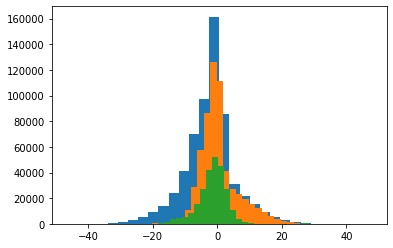

In [ ]:
plt.hist(y1-ypred1**2, bins=30);
plt.hist(y2-ypred2**2, bins=30);
plt.hist(30-ypred3**2, bins=30);

In [ ]:
tmp2 = build_features_wide(data2)
tmp2[np.isnan(tmp2)] = 0.

<ipython-input-77-7741c0b71488>:7: RuntimeWarning: invalid value encountered in true_divide
  (blue-green)/(blue+green),
<ipython-input-77-7741c0b71488>:8: RuntimeWarning: invalid value encountered in true_divide
  (green-red)/(green+red),
<ipython-input-77-7741c0b71488>:9: RuntimeWarning: invalid value encountered in true_divide
  np.log(blue/green),
<ipython-input-77-7741c0b71488>:10: RuntimeWarning: invalid value encountered in true_divide
  (blue-nir)/(blue+nir))).T


In [ ]:
y2_wide = regr2.predict(tmp2)**2

In [ ]:
depth2_pred = y2_wide.reshape(data2.shape[1:])

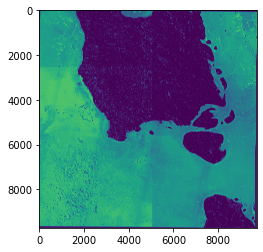

In [ ]:
plt.imshow(depth2_pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


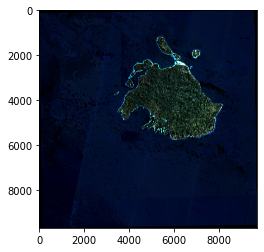

In [ ]:
plt.imshow(10*np.moveaxis(result1[2::-1,:,:], 0, 2))

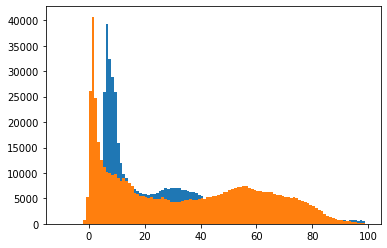

In [ ]:
plt.hist(depth2, bins=np.arange(-10,100,1));
plt.hist(-2*depth1, bins=np.arange(-10,100,1));

In [ ]:
ndwi0.shape

(9672, 9674)

In [ ]:
depth2_all.shape

(9585, 10001)

In [ ]:
depth2_all = np.exp(1.385*np.log(result1[0]/result1[1])+1.546)
depth2_all[depth2_all < 0] = 0.
depth2_all[depth2_all > 100] = 50.
depth2_all[ndwi0] = -1

<ipython-input-315-5228fd030289>:1: RuntimeWarning: invalid value encountered in true_divide
  depth2_all = np.exp(1.385*np.log(result1[0]/result1[1])+1.546)
<ipython-input-315-5228fd030289>:2: RuntimeWarning: invalid value encountered in less
  depth2_all[depth2_all < 0] = 0.
<ipython-input-315-5228fd030289>:3: RuntimeWarning: invalid value encountered in greater
  depth2_all[depth2_all > 100] = 50.


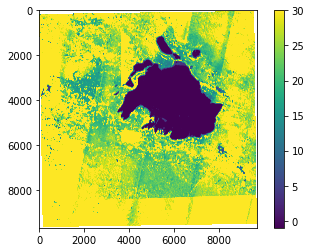

In [ ]:
plt.imshow(depth2_all, vmin=-1,vmax=30)
plt.colorbar()

In [ ]:
tmp = -result2[0,5350:6000,6000:8000].copy()
tmp[tmp > 30] = 30.
depth_d = tmp - depth2_all[5350:6000,6000:8000]
depth_d = np.ma.masked_array(depth_d, result2[0,5350:6000,6000:8000] == 13)

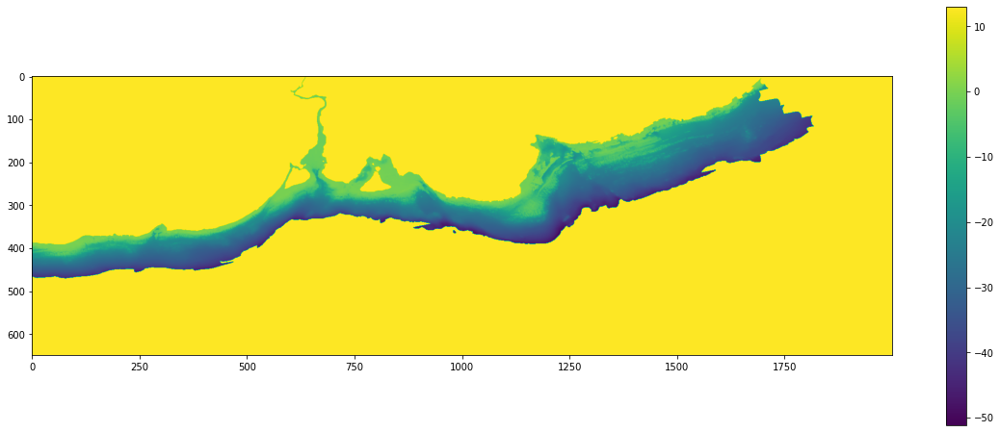

In [ ]:
plt.figure(figsize=(20,8))
plt.imshow(result2[0,5350:6000,6000:8000])
plt.colorbar()

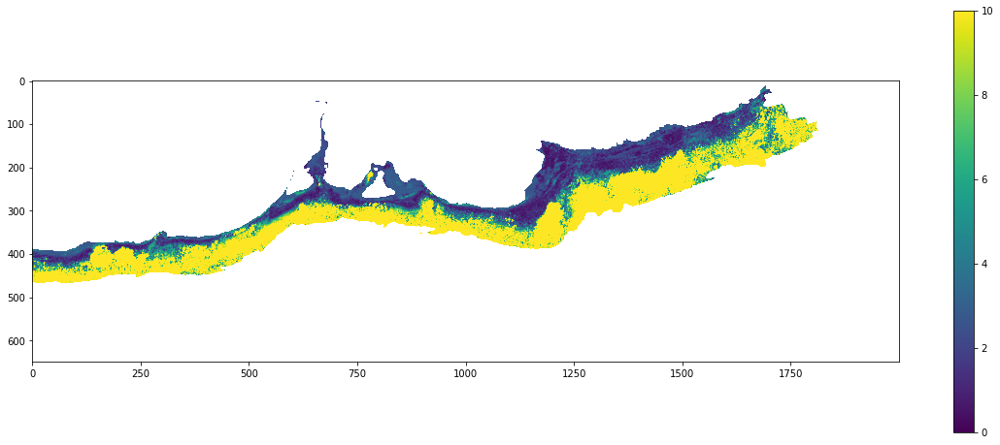

In [ ]:
plt.figure(figsize=(20,8))
plt.imshow(np.abs(depth_d), vmin=0, vmax=10)
plt.colorbar()

In [ ]:
#depth2 = 45.*np.log(1000.*blue1)/np.log(1000.*green1) - 33.
#depth2 = 9.46*np.exp(1.52*np.log(blue1/green1))
depth2 = np.exp(1.385*np.log(blue1/green1)+1.546)
depth2[depth2 < 0] = 0.
depth2[depth2 > 100] = 50.

(0.0, 100.0)

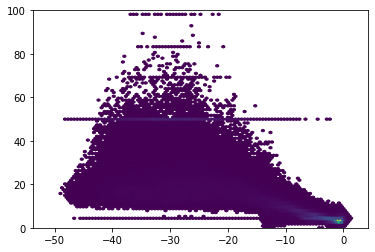

In [ ]:
plt.hexbin(-depth1, depth2, mincnt=10)
plt.ylim(0,100)

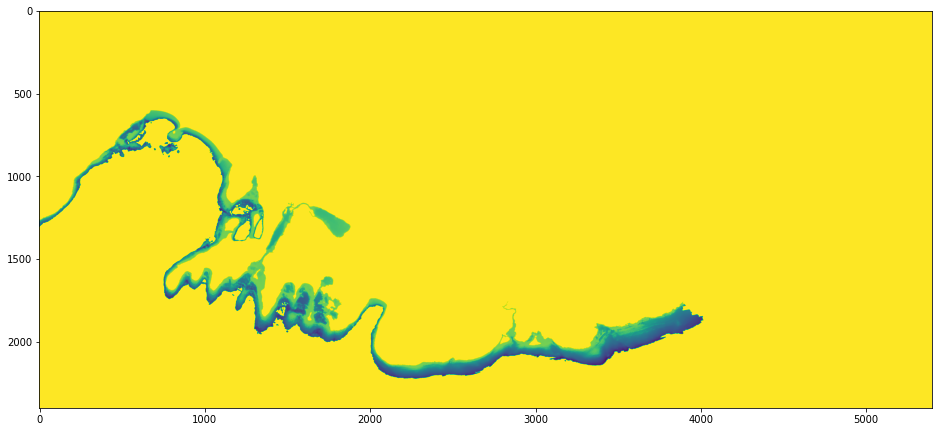

In [ ]:
plt.figure(figsize=(16,12))
plt.imshow(result2[0,3600:6000,3800:9200])

In [ ]:
rgb = np.moveaxis(result1[2::-1,3600:6000,3800:9200], 0, 2).copy()
tmp_mask = result2[0,3600:6000,3800:9200] == 13
rgb[tmp_mask, :] = 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


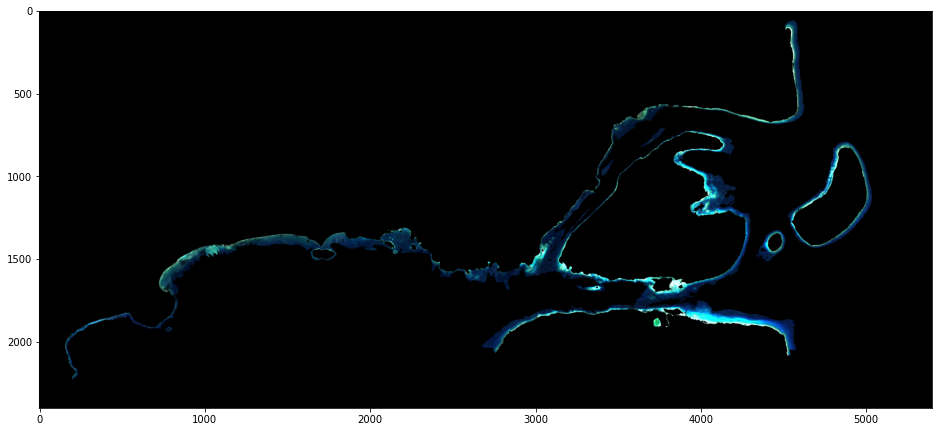

In [ ]:
plt.figure(figsize=(16,12))
plt.imshow(10*rgb)

In [ ]:
depth1a = depth1a[mask].ravel()
depth1b = depth1b[mask].ravel()
depth1c = depth1c[mask].ravel()

In [ ]:
deep_b = result1[0,6000:8000,5000:7000].ravel()
deep_g = result1[1,6000:8000,5000:7000].ravel()
deep_r = result1[2,6000:8000,5000:7000].ravel()
deep_n = result1[3,6000:8000,5000:7000].ravel()

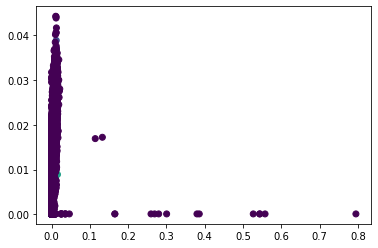

In [ ]:
plt.scatter(deep_g, deep_b, c=deep_n)

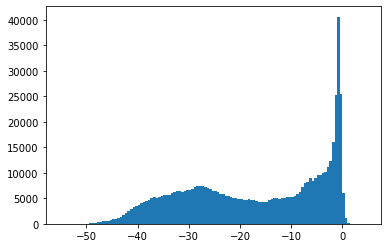

In [ ]:
plt.hist(depth1, bins=np.arange(-55,5,0.5));

In [ ]:
mask1 = depth1 < -30
mask2 = np.logical_and(depth1 > -30, depth1 < -15)
mask3 = np.logical_and(depth1 > -15, depth1 < -2)

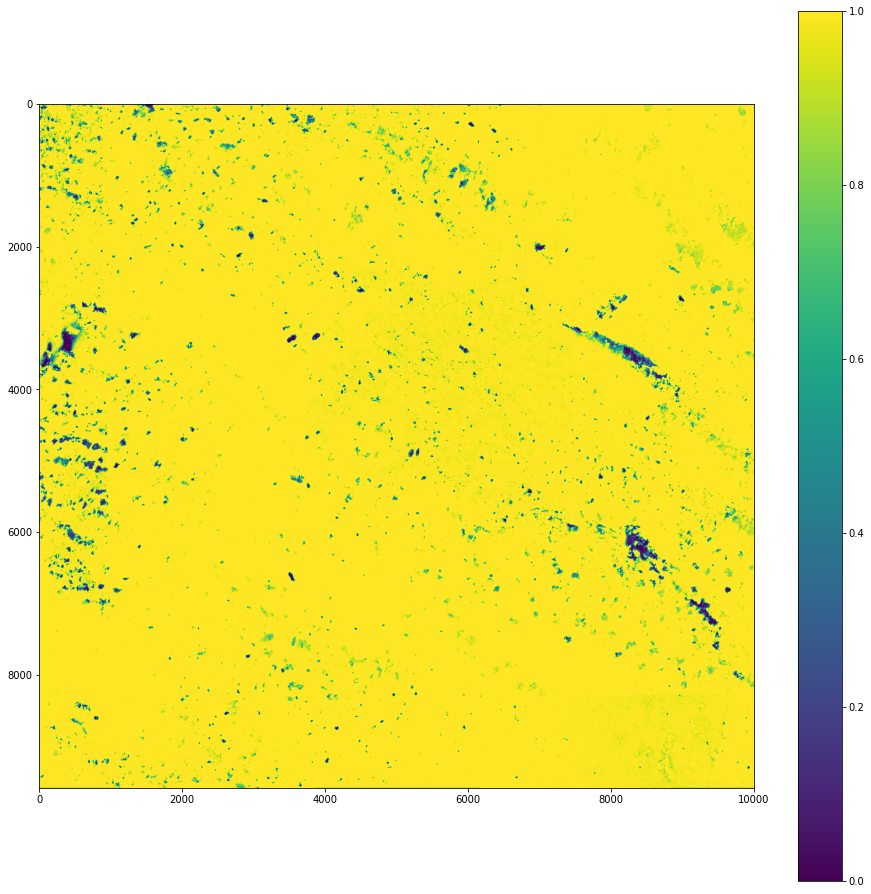

In [ ]:
tmp = data[0,:,:].copy()
tmp[data[0,:,:]!=data[1,:,:]] = 0.
plt.figure(figsize=(16,16))
plt.imshow(data[0,:,:]!=data[1,:,:])
plt.colorbar()

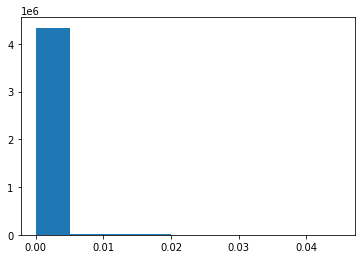

In [ ]:
tmp = result1[0,:,:].copy()
plt.hist(tmp[result1[0,:,:]==result1[1,:,:]].ravel(), bins=np.arange(0,0.05,0.005));

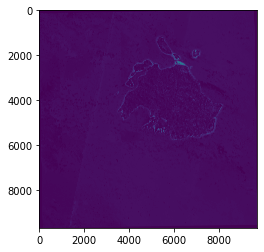

In [ ]:
plt.imshow(result1[0,:,:])

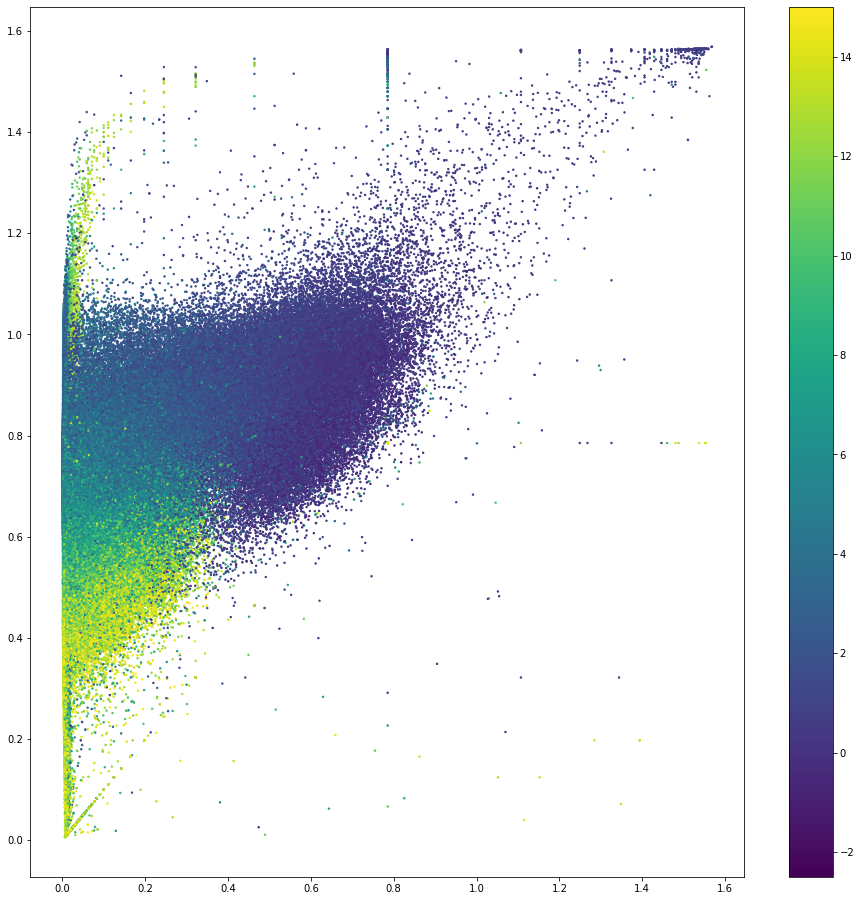

In [ ]:
plt.figure(figsize=(16,16))
plt.scatter(np.arctan(red1[mask3]/blue1[mask3]), np.arctan(green1[mask3]/blue1[mask3]), c=-depth1[mask3], s=2)
plt.colorbar()

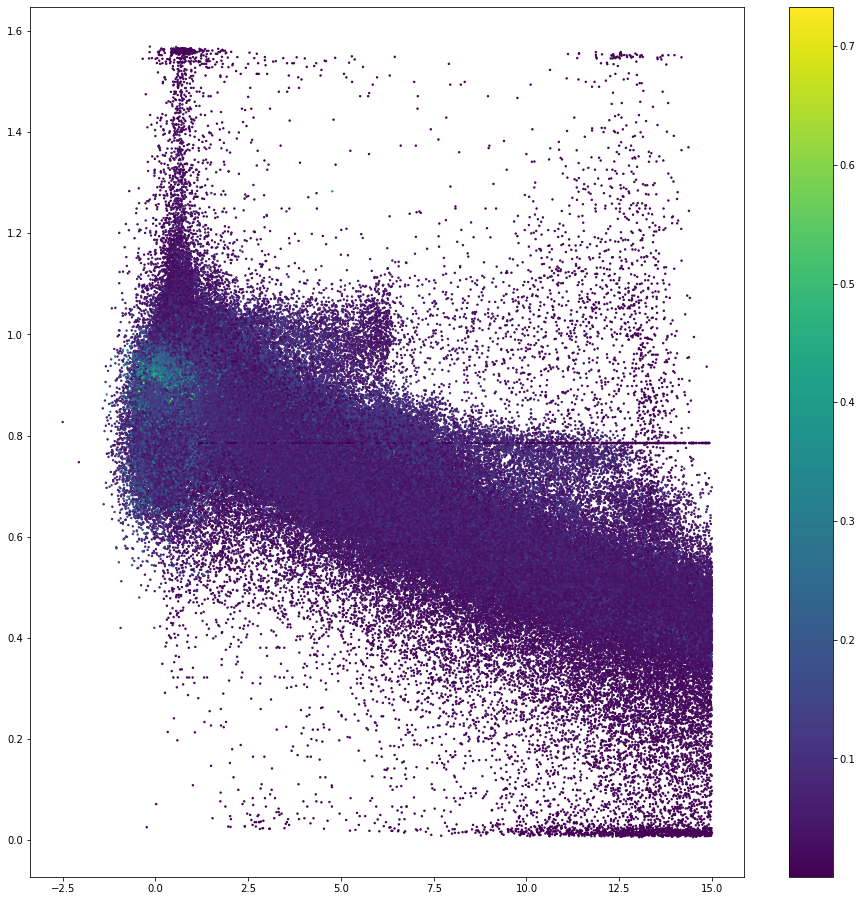

In [ ]:
plt.figure(figsize=(16,16))
plt.scatter(-depth1[mask3], np.arctan(green1[mask3]/blue1[mask3]), c=green1[mask3]+blue1[mask3], s=2)
plt.colorbar()

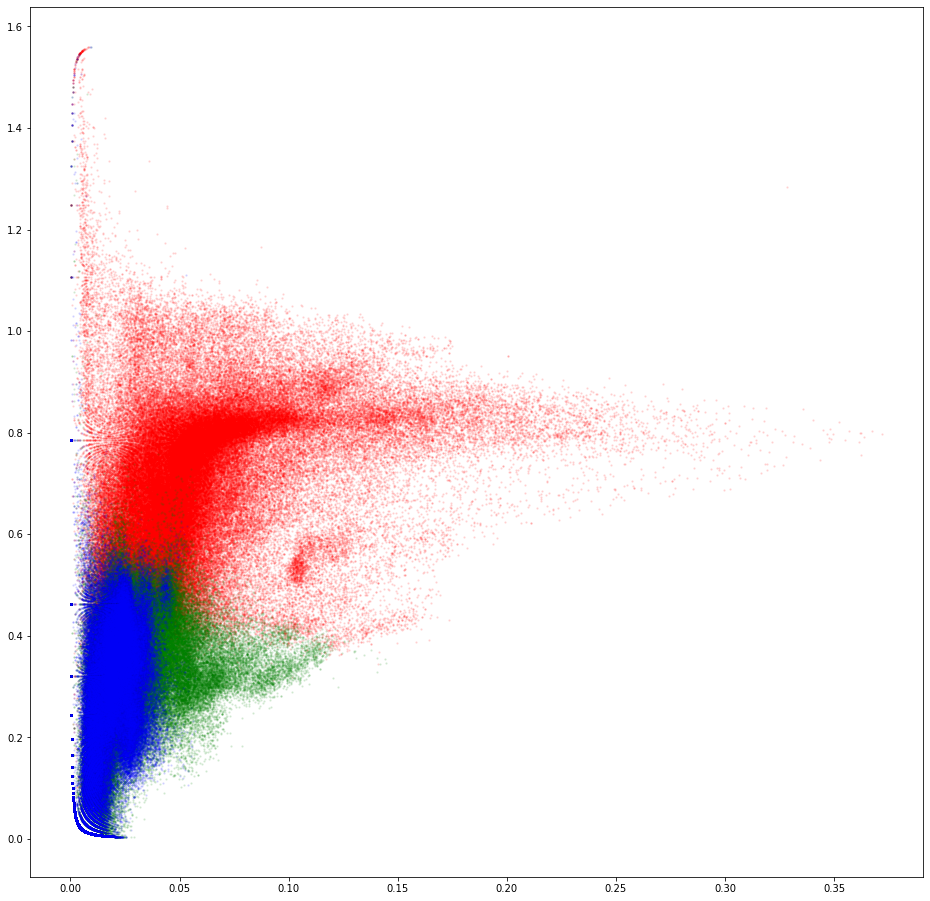

In [ ]:
xarr = np.sqrt(green1**2+blue1**2)
yarr = np.arctan(green1/blue1)
plt.figure(figsize=(16,16))
plt.scatter(xarr[mask3], yarr[mask3], c='r', s=2, alpha=0.1)
plt.scatter(xarr[mask2], yarr[mask2], c='g', s=2, alpha=0.1)
plt.scatter(xarr[mask1], yarr[mask1], c='b', s=2, alpha=0.1)
#plt.scatter(deep_g, deep_b, c='k', s=2)
if False:
    plt.xlim(0,0.3)
    plt.ylim(0,0.3)

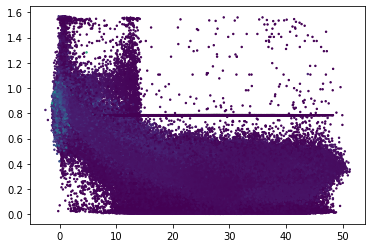

In [ ]:
plt.scatter(-depth1, yarr, c=xarr, s=2)

In [ ]:
mask1 = np.logical_and(depth1 < -2, depth1 > -15)
X = np.vstack([(green1/blue1),
                (green1/blue1)**2,
                (red1/green1),
                (red1/green1)**2,
                green1+blue1]).T
y = -depth1.T
X = X[mask1,:]
y = y[mask1]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.25, random_state=42)

In [ ]:
lr = Ridge(alpha=0.1)
lr.fit(X_train, y_train)
y_1 = lr.predict(X_train)
y_2 = lr.predict(X_test)

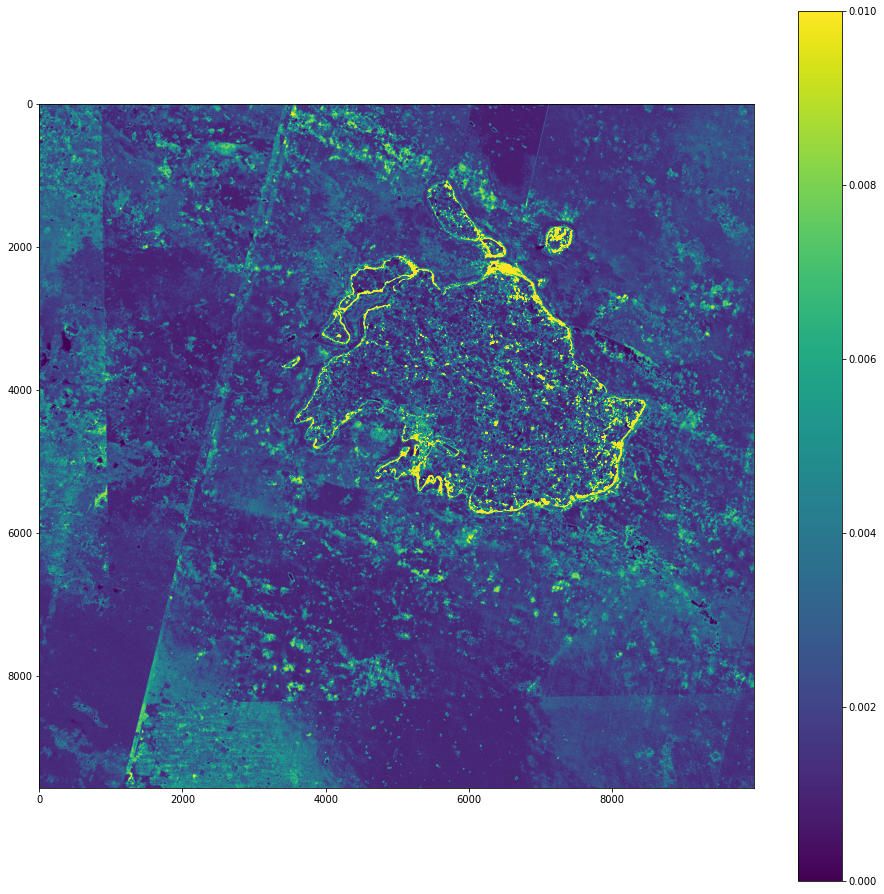

In [ ]:
dtmp = data1 / 10000.
ddiff = np.array([dtmp[ii] - gaussian_filter(dtmp[ii], 1.) for ii in range(len(dtmp))])
plt.figure(figsize=(16,16))
plt.imshow(np.abs(ddiff[0,10:-10,10:-10]), vmin=0, vmax=0.01)
plt.colorbar()

In [ ]:
lr.coef_

array([ -3.0558176 ,   0.05149819,  -1.4156871 ,   0.05808087,
       -21.215677  ], dtype=float32)

In [ ]:
np.std(y_1-y_train), np.std(y_2-y_test)

(3.1213312, 3.157283)

In [ ]:
neigh = KNeighborsRegressor(n_neighbors=5, algorithm='ball_tree')

In [ ]:
neigh.fit(X_train, y_train)
y_1 = neigh.predict(X_train)
y_2 = neigh.predict(X_test)

In [ ]:
np.std(y_1-y_train), np.std(y_2-y_test)

(3.742895, 4.4598184)

(0.0, 15.0)

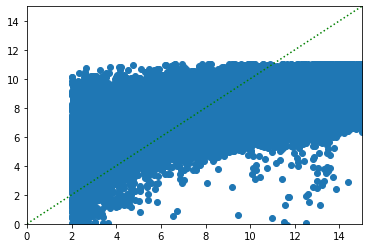

In [ ]:
plt.scatter(y_train, y_1)
plt.plot([0,50],[0,50],c='g',ls=':')
plt.xlim(0,15)
plt.ylim(0,15)

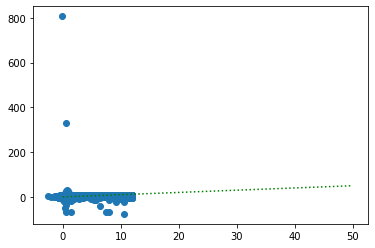

In [ ]:
plt.scatter(-y_test, -y_2)
plt.plot([0,50],[0,50],c='g',ls=':')

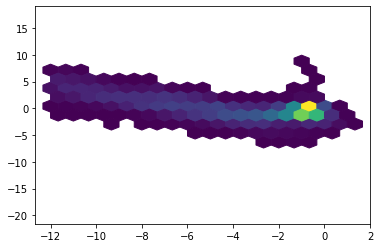

In [ ]:
plt.hexbin(y_train, y_1-y_train, mincnt=10, gridsize=20)

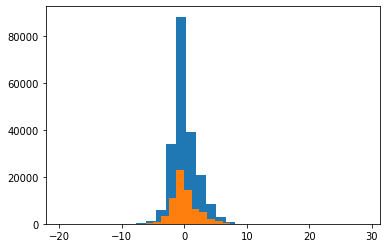

In [ ]:
plt.hist(y_2-y_test, bins=30);
plt.hist(y_1-y_train, bins=30);

In [ ]:
rng = np.random.RandomState(1)
regr = AdaBoostRegressor(DecisionTreeRegressor(max_depth=8),
                          n_estimators=300, random_state=rng)

regr.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=8),
                  n_estimators=300,
                  random_state=RandomState(MT19937) at 0x7FDDF2097440)

In [ ]:
y_1 = regr.predict(X_train)

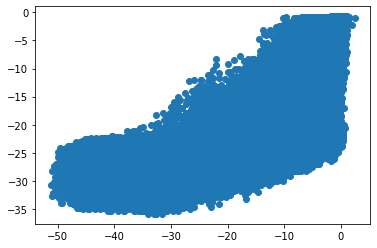

In [ ]:
plt.scatter(y_train, y_1)

In [ ]:
from sklearn.svm import SVR

In [ ]:
regr1 = SVR(C=1.0, epsilon=0.2)

In [ ]:
regr1.fit(X_train[::10,:], y_train[::10])

SVR(epsilon=0.2)

In [ ]:
y_2 = regr1.predict(X_train)

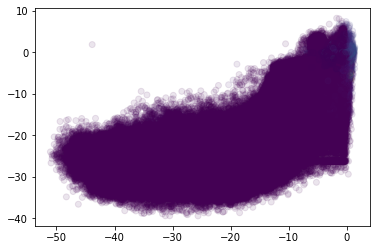

In [ ]:
plt.scatter(y_train, y_2, c=X_train[:,3], alpha=0.1, vmin=0,vmax=0.15)

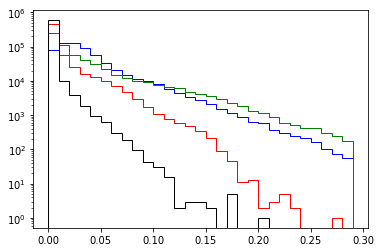

In [ ]:
plt.hist(blue1, color='b', histtype='step', bins=np.arange(0,0.3,0.01), log=True)
plt.hist(green1, color='g', histtype='step', bins=np.arange(0,0.3,0.01), log=True)
plt.hist(red1, color='r', histtype='step', bins=np.arange(0,0.3,0.01), log=True)
plt.hist(nir1, color='k', histtype='step', bins=np.arange(0,0.3,0.01), log=True);

(0.0, 0.02)

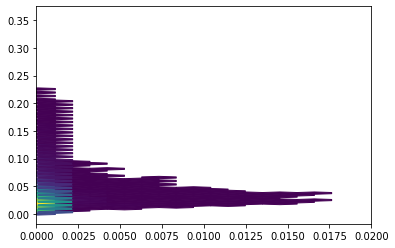

In [ ]:
plt.hexbin(nir1, blue1, mincnt=100)
plt.xlim(0,0.02)

(0.0, 0.02)

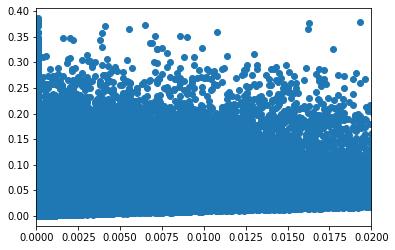

In [ ]:
plt.scatter(nir1, green1)
plt.xlim(0,0.02)

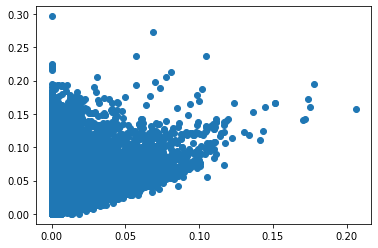

In [ ]:
plt.scatter(nir1, red1)

In [ ]:
pca = PCA(n_components=4, whiten=True)

In [ ]:
feature = np.vstack((blue1, green1, red1, nir1)).T

In [ ]:
proj1 = pca.fit_transform(feature)

In [ ]:
pca.explained_variance_ratio_

array([0.94222434, 0.03781187, 0.0146021 , 0.00536168])

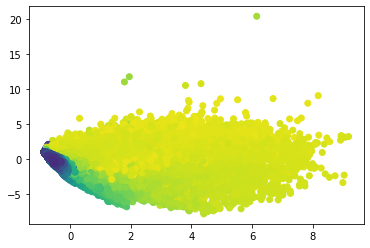

In [ ]:
plt.scatter(proj1[:,0], proj1[:,1], c=depth1)

In [ ]:
mask2 = depth1 < -30

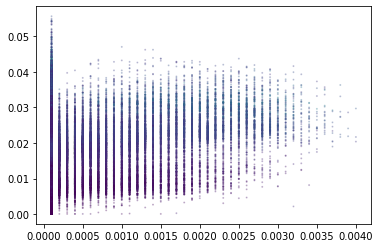

In [ ]:
plt.scatter(nir1[mask2], blue1[mask2], c=green1[mask2], alpha=0.25, s=1)

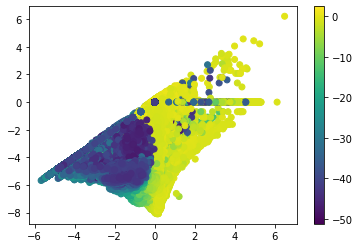

In [ ]:
plt.scatter(np.log(green1/blue1), np.log(nir1/blue1), c=depth1)
plt.colorbar()

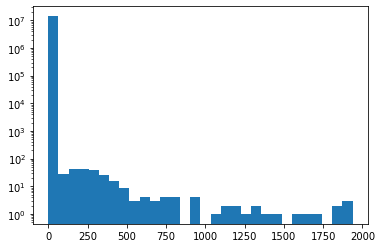

In [ ]:
plt.hist((result1[1])[result1[3] == result1[1]].ravel(), bins=30, log=True);

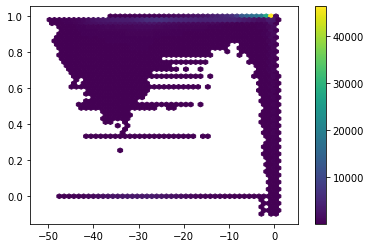

In [ ]:
plt.hexbin(depth1, ndwi1, mincnt=20, gridsize=50)
plt.colorbar()

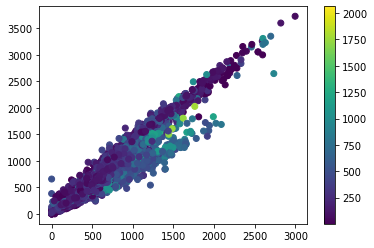

In [ ]:
plt.scatter(blue1, green1, c=nir1)
plt.colorbar()

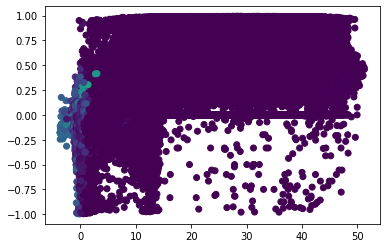

In [ ]:
plt.scatter(-depth1, (blue1-green1)/(blue1+green1), c=nir1)

<ipython-input-184-c082e06c1362>:1: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(result1[0][3,4000:6000,3000:8000]/10000.)


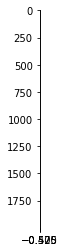

In [ ]:
plt.imshow(result1[0][3,4000:6000,3000:8000]/10000.)

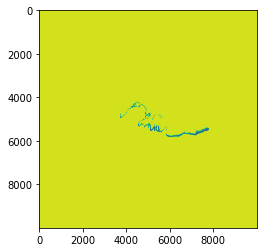

In [ ]:
plt.imshow(result2[0][0,:,:])

In [ ]:
reproject?

In [ ]:
depth_lst = []
for idx in [22,23,31,32]:
    print('Loading', idx)
    obj = obj_lst[idx]
    data = np.moveaxis(obj.read().astype(np.float32),0,2)/10000.
    print('Processing')

    my_ndwi = ndwi(data)
    depth = bath_dierssen(data)
    depth[~my_ndwi] = -1.

    depth_lst.append((depth, obj))

Loading 22
Processing


<ipython-input-2-9134786bc45d>:7: RuntimeWarning: invalid value encountered in true_divide
  tmp = (data[:,:,1]-data[:,:,3])/(data[:,:,1]+data[:,:,3])
<ipython-input-2-9134786bc45d>:12: RuntimeWarning: invalid value encountered in true_divide
  tmp = 9.46*np.exp(1.52*np.log(data[:,:,0]/data[:,:,1]))
<ipython-input-2-9134786bc45d>:13: RuntimeWarning: invalid value encountered in less
  tmp[tmp<0.] = 0.
<ipython-input-2-9134786bc45d>:14: RuntimeWarning: invalid value encountered in greater
  tmp[tmp>30.] = 30.


Loading 23
Processing
Loading 31
Processing
Loading 32
Processing


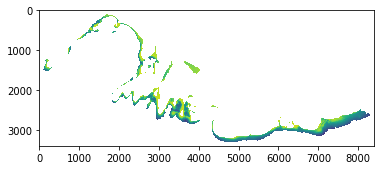

In [ ]:
plt.imshow(db_mask)

(-17.9, -17.6)

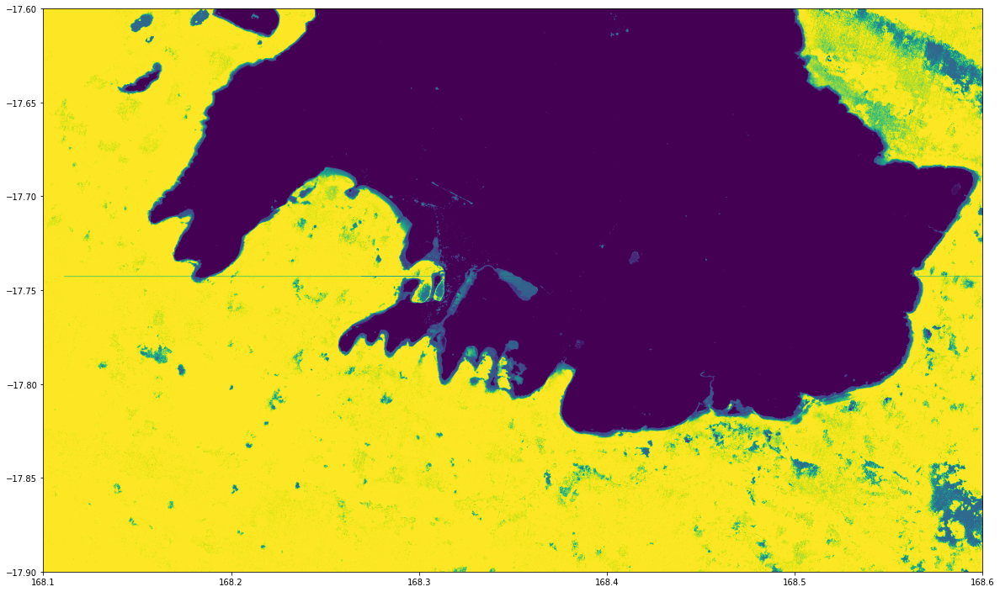

In [ ]:
base = plt.figure(figsize=(20,20))
ax = base.gca()
for data, obj in depth_lst:
    show(data, ax=ax, transform=obj.transform)
plt.xlim(168.1, 168.6)
plt.ylim(-17.9,-17.6)

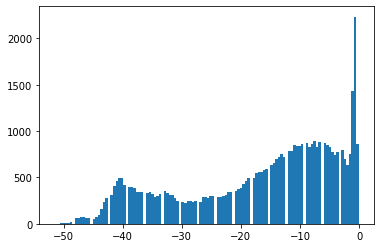

In [ ]:
plt.hist(shpt['ALTITUDE'], bins=120);

In [ ]:
base = plt.figure(figsize=(30,30))
ax = base.gca()
for data, obj in depths:
    show(data, ax=ax, transform=obj.transform)
show(bdata, ax=ax, transform=trs)
#plt.xlim(166.5, 168)
#plt.ylim(-15,-13.5)
plt.xlim(167, 170)
plt.ylim(-24,-12)

In [ ]:
mosaic = merge([rasterio.open(all_files[ii], dtype=np.float32) for ii in [11,12,18,19]])


AxisError: destination: axis 2 is out of bounds for array of dimension 1

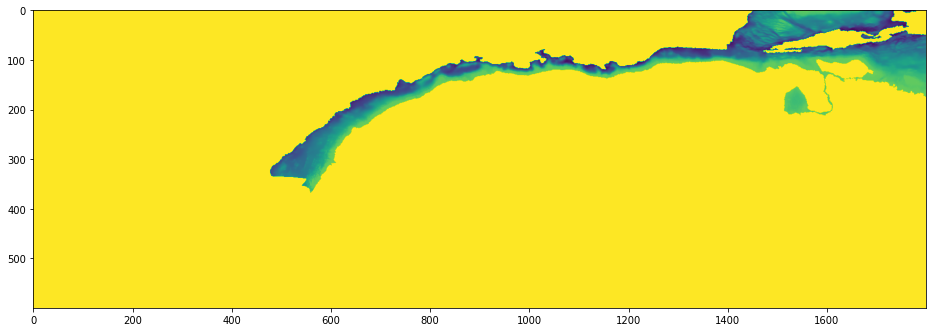

In [ ]:
plt.figure(figsize=(16,12))
plt.imshow(result2[0][5300:5900,6000:7800])

In [ ]:
mosaic2 = np.moveaxis(mosaic[0], 0, 2)/10000.
obj = mosaic[1]

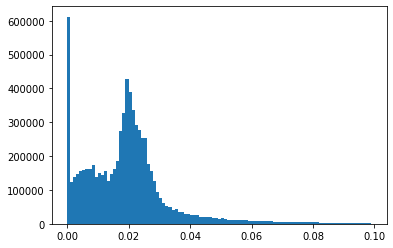

In [ ]:
plt.hist(mosaic2[3750:6250,5000:8000,0].ravel(), bins=np.arange(0,0.1,0.001));

In [ ]:
[np.min(mosaic2[3750:6250,5000:8000,ii]) for ii in range(4)]

[0.0001, 0.0001, 0.0001, 0.0001]

In [ ]:
mos_zoom = mosaic2[3750:6250,5000:8000,:]

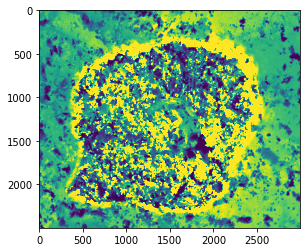

In [ ]:
plt.imshow(mosaic2[3750:6250,5000:8000,0], vmin=0, vmax=0.03)

In [ ]:
depths = []
for ff in all_files:
    print('Loading', ff)
    obj = rasterio.open(ff)
    data = np.moveaxis(obj.read().astype(np.float32),0,2)/10000.
    print('Processing')

    my_ndwi = ndwi(data)
    depth = bath_dierssen(data)
    depth[~my_ndwi] = -1.

    depths.append((depth, obj))

Loading AOIs/vanuatu_mosaic_aoi_000000.tif
Processing


<ipython-input-3-9134786bc45d>:7: RuntimeWarning: invalid value encountered in true_divide
  tmp = (data[:,:,1]-data[:,:,3])/(data[:,:,1]+data[:,:,3])
<ipython-input-3-9134786bc45d>:12: RuntimeWarning: invalid value encountered in true_divide
  tmp = 9.46*np.exp(1.52*np.log(data[:,:,0]/data[:,:,1]))
<ipython-input-3-9134786bc45d>:13: RuntimeWarning: invalid value encountered in less
  tmp[tmp<0.] = 0.
<ipython-input-3-9134786bc45d>:14: RuntimeWarning: invalid value encountered in greater
  tmp[tmp>30.] = 30.


Loading AOIs/vanuatu_mosaic_aoi_000001.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000002.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000003.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000004.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000005.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000006.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000007.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000008.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000009.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000010.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000011.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000012.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000013.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000014.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000015.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000016.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000017.tif
Processing
Loading AOIs/vanuatu_mosaic_aoi_000018.tif
Processing
Loading AOIs/vanuatu_mosaic_

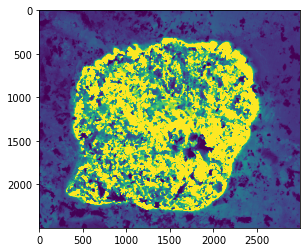

In [ ]:
plt.imshow(mosaic2[3750:6250,5000:8000,1], vmin=0, vmax=0.03)

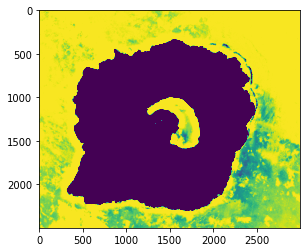

In [ ]:
plt.imshow(-mosaic2[3750:6250,5000:8000,3], vmin=-0.01, vmax=0.0)

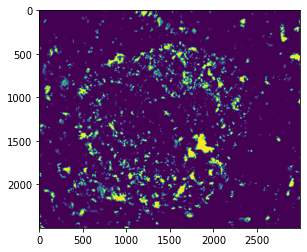

In [ ]:
plt.imshow(mosaic2[3750:6250,5000:8000,0] == 0.0001)

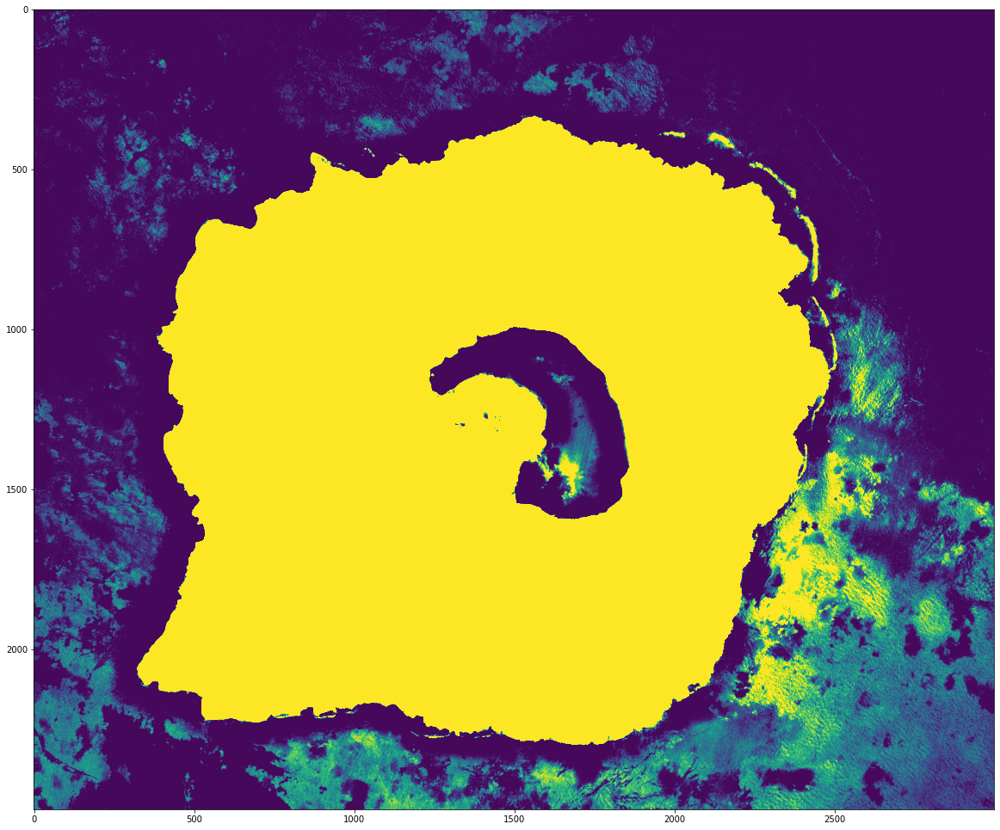

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(mosaic2[3750:6250,5000:8000,3], vmin=0, vmax=0.005)

In [ ]:
elounta = rasterio.open('AOIs/elounta_test.tif').read()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


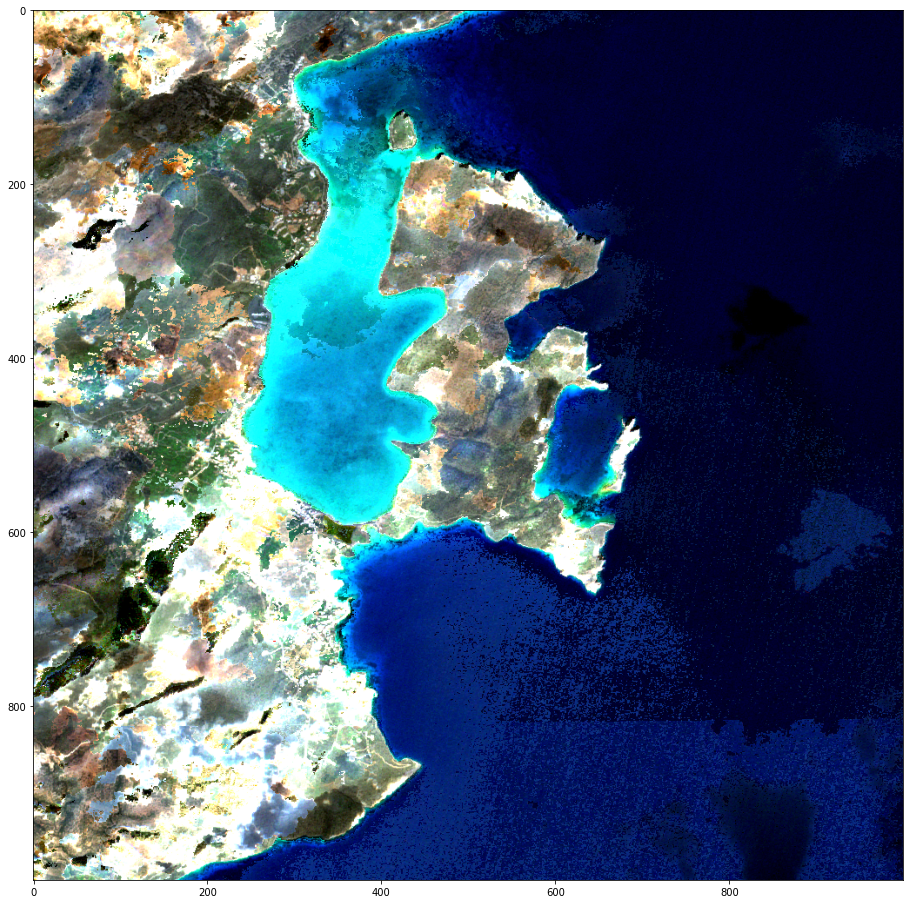

In [ ]:
plt.figure(figsize=(16,16))
plt.imshow(0.002*np.moveaxis(elounta[2::-1,1000:2000,:1000],0,2))

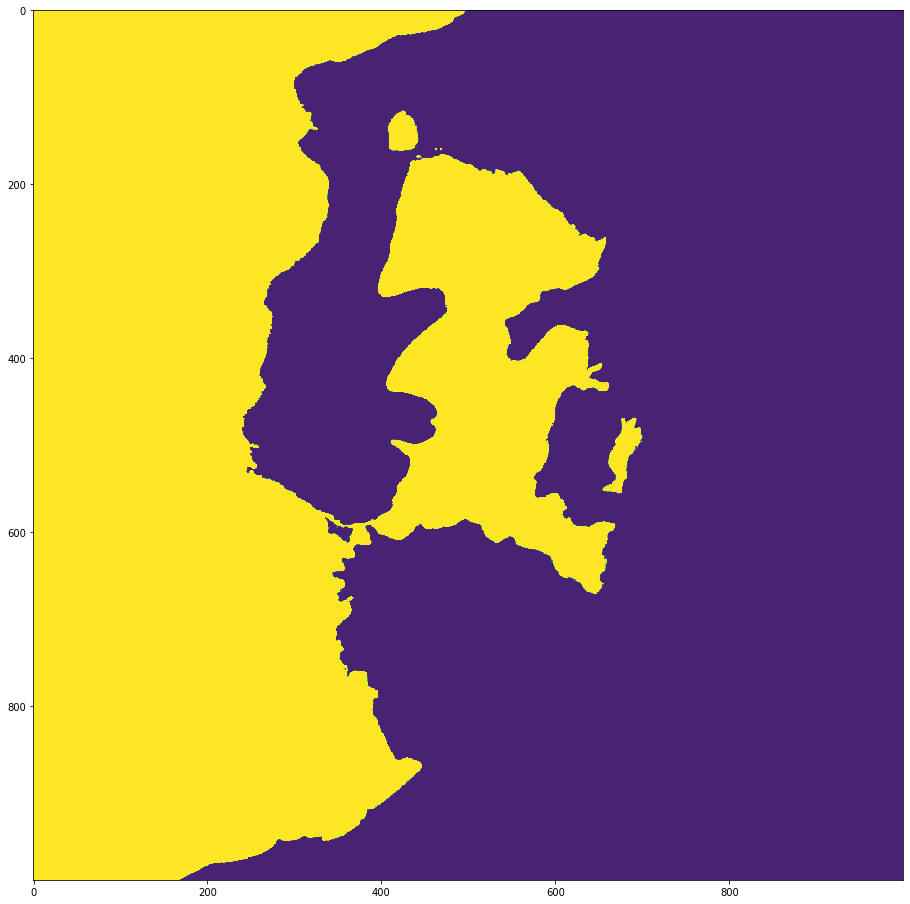

In [ ]:
plt.figure(figsize=(16,16))
plt.imshow(elounta[3,1000:2000,:1000], vmin=0,vmax=10)